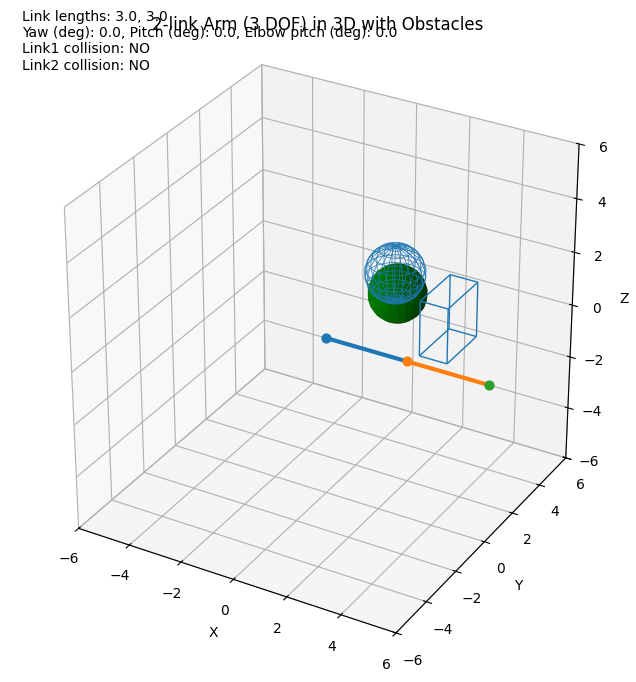

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Line3DCollection
import math

def rotation_matrix(axis, theta):
    axis = axis / np.linalg.norm(axis)
    a = math.cos(theta / 2.0)
    b, c, d = -axis * math.sin(theta / 2.0)
    aa, bb, cc, dd = a*a, b*b, c*c, d*d
    bc, ad, ac, ab, bd, cd = b*c, a*d, a*c, a*b, b*d, c*d
    return np.array([[aa+bb-cc-dd, 2*(bc+ad),   2*(bd-ac)  ],
                     [2*(bc-ad),   aa+cc-bb-dd, 2*(cd+ab)  ],
                     [2*(bd+ac),   2*(cd-ab),   aa+dd-bb-cc]])

def compute_arm_points(l1, l2, yaw, pitch, joint_angle):
    # Link 1 direction in world frame (spherical coordinates)
    # yaw = rotation around z (azimuth), pitch = elevation from XY plane
    dx1 = math.cos(pitch) * math.cos(yaw)
    dy1 = math.cos(pitch) * math.sin(yaw)
    dz1 = math.sin(pitch)
    dir1 = np.array([dx1, dy1, dz1])
    p0 = np.array([0.0, 0.0, 0.0])
    p1 = p0 + l1 * dir1

    # Create rotation matrix that maps local x-axis (1,0,0) to dir1
    # Find rotation axis = cross([1,0,0], dir1)
    x_axis = np.array([1.0, 0.0, 0.0])
    v = np.cross(x_axis, dir1)
    if np.linalg.norm(v) < 1e-8:
        # dir1 is (nearly) aligned with x-axis (no rotation or 180 deg)
        if np.dot(x_axis, dir1) > 0:
            R = np.eye(3)
        else:
            # 180 deg rotation around any perpendicular axis, choose z
            R = rotation_matrix(np.array([0,0,1]), np.pi)
    else:
        angle = math.acos(np.dot(x_axis, dir1) / (np.linalg.norm(x_axis)*np.linalg.norm(dir1)))
        R = rotation_matrix(v, angle)

    # In the local frame attached to link1, place link2 oriented by joint_angle in x-z plane:
    # local vector for link2 (pitch): rotate from +x toward +z by joint_angle
    local_link2 = np.array([math.cos(joint_angle)*l2, 0.0, math.sin(joint_angle)*l2])
    dir2_world = R.dot(local_link2)
    p2 = p1 + dir2_world

    return p0, p1, p2

def sample_segment(p_start, p_end, n=50):
    t = np.linspace(0, 1, n)
    return np.vstack([p_start + (p_end - p_start) * ti for ti in t])

def point_in_box(pt, box_min, box_max):
    return np.all(pt >= box_min - 1e-9) and np.all(pt <= box_max + 1e-9)

def segment_collides_obstacles(p_start, p_end, obstacles, n_samples=100):
    pts = sample_segment(p_start, p_end, n_samples)
    for i, obs in enumerate(obstacles):
        if obs['type'] == 'sphere':
            center = np.array(obs['center'])
            r = obs['radius']
            d2 = np.sum((pts - center)**2, axis=1)
            if np.any(d2 <= r**2):
                return True, i+1
        elif obs['type'] == 'box':
            mn = np.array(obs['min'])
            mx = np.array(obs['max'])
            inside = np.all((pts >= mn) & (pts <= mx), axis=1)
            if np.any(inside):
                return True, i+1
    return False, 0

def plot_arm_and_obstacles(link_len, yaw, pitch, joint_angle, obstacles):
    l1, l2 = link_len
    p0, p1, p2 = compute_arm_points(l1, l2, yaw, pitch, joint_angle)

    fig = plt.figure(figsize=(10,8))
    ax = fig.add_subplot(111, projection='3d')
    ax.set_box_aspect([1,1,1])

    # Plot links as lines (default color cycle will be used)
    xs = [p0[0], p1[0], p2[0]]
    ys = [p0[1], p1[1], p2[1]]
    zs = [p0[2], p1[2], p2[2]]
    ax.plot(xs[:2], ys[:2], zs[:2], linewidth=3)
    ax.plot(xs[1:], ys[1:], zs[1:], linewidth=3)

    # Plot joint markers
    ax.scatter([p0[0]], [p0[1]], [p0[2]], s=40)
    ax.scatter([p1[0]], [p1[1]], [p1[2]], s=40)
    ax.scatter([p2[0]], [p2[1]], [p2[2]], s=40)

    # Plot obstacles (spheres as wireframe, boxes as edges)
    for obs in obstacles:
        if obs['type'] == 'sphere' or obs['type'] == 'goal':
            center = np.array(obs['center'])
            r = obs['radius']
            u = np.linspace(0, 2*np.pi, 24)
            v = np.linspace(0, np.pi, 12)
            x = center[0] + r * np.outer(np.cos(u), np.sin(v))
            y = center[1] + r * np.outer(np.sin(u), np.sin(v))
            z = center[2] + r * np.outer(np.ones_like(u), np.cos(v))
            if obs['type'] == 'sphere':
                ax.plot_wireframe(x, y, z, linewidth=0.5)
            else:
                ax.plot_surface(x, y, z, linewidth=0.5, color = 'g')
        elif obs['type'] == 'box':
            mn = np.array(obs['min'])
            mx = np.array(obs['max'])
            # 8 corners
            corners = np.array([[mn[0], mn[1], mn[2]],
                                [mx[0], mn[1], mn[2]],
                                [mx[0], mx[1], mn[2]],
                                [mn[0], mx[1], mn[2]],
                                [mn[0], mn[1], mx[2]],
                                [mx[0], mn[1], mx[2]],
                                [mx[0], mx[1], mx[2]],
                                [mn[0], mx[1], mx[2]]])
            # edges to draw
            edges = [
                (0,1),(1,2),(2,3),(3,0),
                (4,5),(5,6),(6,7),(7,4),
                (0,4),(1,5),(2,6),(3,7)
            ]
            lines = [(corners[a], corners[b]) for (a,b) in edges]
            lc = Line3DCollection(lines, linewidths=1)
            ax.add_collection3d(lc)

    # Simple collision check
    coll1, idx1 = segment_collides_obstacles(p0, p1, obstacles)
    coll2, idx2 = segment_collides_obstacles(p1, p2, obstacles)
    text_lines = [
        f"Link lengths: {l1}, {l2}",
        f"Yaw (deg): {np.degrees(yaw):.1f}, Pitch (deg): {np.degrees(pitch):.1f}, Elbow pitch (deg): {np.degrees(joint_angle):.1f}",
        f"Link1 collision: {'YES (obs '+str(idx1)+')' if coll1 else 'NO'}",
        f"Link2 collision: {'YES (obs '+str(idx2)+')' if coll2 else 'NO'}"
    ]
    ax.text2D(0.02, 0.95, "\n".join(text_lines), transform=ax.transAxes)

    # Axis labels and view
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    max_range = max(np.ptp(xs+ys+zs), 1.0)

    ax.set_xlim(-max_range, max_range)
    ax.set_ylim(-max_range, max_range)
    ax.set_zlim(-max_range, max_range)

    ax.set_title('2-link Arm (3 DOF) in 3D with Obstacles')
    plt.show()


# Example usage
link_len = [3.0, 3.0]
yaw = np.radians(0)       # base yaw
pitch = np.radians(0)     # base pitch (elevation)
joint_angle = np.radians(0)  # elbow/pitch relative to link1

goal = {'center':[1.0, 3.0, 0.5], 'radius':1}
# Define obstacles: sphere and axis-aligned box
obstacles = [
    {'type':'sphere', 'center':[2.0, 1.0, 2.5], 'radius':1},
    {'type':'box', 'min':[4.0, -1.0, 1], 'max':[5.0, 1.0, 3]},
    {'type': 'goal', 'center':goal['center'], 'radius':goal['radius']}
]
plot_arm_and_obstacles(link_len, yaw, pitch, joint_angle, obstacles)

# You can change yaw, pitch, joint_angle or obstacles and re-run to visualize different configurations.


In [5]:
res_pts = 35
# Define the range of angles
angles = np.linspace(0, 2*np.pi, num=res_pts, endpoint=False)

# Initialize array to store collision information
collision_array = np.zeros((len(angles), len(angles), len(angles)), dtype=int)



# Iterate over angles and check for collisions
l1, l2 = link_len
count = 0
for i, theta1 in enumerate(angles):
    for j, theta2 in enumerate(angles):
        for k, theta3 in enumerate(angles):
            p0, p1, p2 = compute_arm_points(l1, l2, theta1, theta2, theta3)
            temp, a = segment_collides_obstacles(p0, p1, obstacles)
            if np.linalg.norm(p2 - np.array(goal['center'])) <= int(goal['radius']) :
                count += 1
                collision_array[i, j, k] = len(obstacles)
                # plot_arm_and_obstacles(link_len, theta1, theta2, theta3, obstacles)
            if a > 0:
                collision_array[i, j, k] = a
                continue
            temp, b = segment_collides_obstacles(p1, p2, obstacles)
            if b > 0:
                collision_array[i, j, k] = b
                continue
            # Check if the end effector is inside the goal sphere


print(count)

109


In [6]:
obstacle_colors = ['red', 'purple', 'green']

def plot_collision_3d(ax, collision_array, angles, obstacle_colors, opacity=1):
    len_angles = len(angles)
    # Plot each point with color based on collision information
    for i in range(collision_array.shape[0]):
        for j in range(collision_array.shape[1]):
            for k in range(collision_array.shape[2]):
                color_index = collision_array[i, j, k] - 1  # Subtract 1 to match the index of colors list
                if (color_index == -1 ):
                    continue

                # Apply the user's logic to handle angles greater than 2*pi
                ang1 = angles[i % len_angles] + 2 * np.pi * (i // len_angles)
                ang2 = angles[j % len_angles] + 2 * np.pi * (j // len_angles)
                ang3 = angles[k % len_angles] + 2 * np.pi * (k // len_angles)

                ax.scatter(ang1, ang2, ang3, color=obstacle_colors[color_index], s=(2 + 3*(collision_array[i, j, k]/len(obstacle_colors)) ), alpha=opacity)

    ax.set_xlabel('Theta1')
    ax.set_ylabel('Theta2')
    ax.set_zlabel('Theta3')
    ax.set_title('Collision Information in 3D')
    return ax

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import math
import random
from collections import namedtuple

Node = namedtuple('Node', ['pt', 'parent', 'cost'])  # pt is np.array([x,y,z])

def find_goal(collision_array):
    inds = np.argwhere(collision_array == 3)
    if inds.shape[0] == 0:
        return None
    return inds[0].astype(float)

def is_in_bounds(pt, shape):
    return all(0 <= pt[i] < shape[i] for i in range(3))

def collision_check_segment(p1, p2, collision_array, step=0.01):
    """Return True if the segment collides with obstacles (values 1 or 2) or leaves bounds."""
    vec = p2 - p1
    length = np.linalg.norm(vec)
    if length == 0:
        idx = tuple(np.round(p1).astype(int))
        if not is_in_bounds(idx, collision_array.shape):
            return True
        return collision_array[idx] in (1,2)
    n_samples = max(2, int(math.ceil(length / step)))
    for t in np.linspace(0, 1, n_samples):
        pt = p1 + t * vec
        idx = tuple(np.round(pt).astype(int))
        if not is_in_bounds(idx, collision_array.shape):
            return True  # out-of-bounds = collision
        val = collision_array[idx]
        if val in (1,2):
            return True
    return False
# def collision_check_segment(p1, p2, collision_array, step=0.01):
#     """Return True if the segment collides with obstacles (values 1 or 2) or leaves bounds.
#     For each sampled point along the segment we check the 6 neighbors + center point."""
#     vec = p2 - p1
#     length = np.linalg.norm(vec)

#     # def check_neighborhood_at_point(pt):
#     #     """Return True if center or any of 6 face-adjacent neighbors are out-of-bounds or obstacle."""
#     #     center_idx = np.round(pt).astype(int)
#     #     cx, cy, cz = center_idx

#     #     # Offsets for center and 6 face-adjacent neighbors
#     #     offsets = [
#     #         (0, 0, 0),  # Center
#     #         (1, 0, 0), (-1, 0, 0),
#     #         (0, 1, 0), (0, -1, 0),
#     #         (0, 0, 1), (0, 0, -1)
#     #     ]

#     #     for dx, dy, dz in offsets:
#     #         idx = (cx + dx, cy + dy, cz + dz)
#     #         if not is_in_bounds(idx, collision_array.shape):
#     #             return True  # treat out-of-bounds as collision
#     #         val = collision_array[idx]
#     #         if val in (1, 2):
#     #             return True
#     #     return False

#     if length == 0:
#         return check_neighborhood_at_point(p1)

#     n_samples = max(2, int(math.ceil(length / step)))
#     for t in np.linspace(0, 1, n_samples):
#         pt = p1 + t * vec
#         if check_neighborhood_at_point(pt):
#             return True

#     return False

def nearest_node_index(tree, sample_pt):
    dists = [np.linalg.norm(n.pt - sample_pt) for n in tree]
    return int(np.argmin(dists))

def steer(from_pt, to_pt, step_size):
    vec = to_pt - from_pt
    dist = np.linalg.norm(vec)
    if dist <= step_size or dist == 0.0:
        return to_pt.copy()
    return from_pt + (vec / dist) * step_size

def get_near_indices(tree, new_pt, radius):
    return [i for i,n in enumerate(tree) if np.linalg.norm(n.pt - new_pt) <= radius]

def rrt_star(collision_array, start=(0,0,0), max_iters=2000, step_size=2.0, search_radius=3.0, goal_sample_rate=0.01):
    """
    Returns: tree (list of Nodes), path (list of pts) or None, goal_pt
    """
    shape = collision_array.shape
    goal_pt = find_goal(collision_array)
    if goal_pt is None:
        raise ValueError("No goal (value 3) found in collision_array")
    start = np.array(start, dtype=float)
    if collision_array[tuple(np.round(start).astype(int))] in (1,2):
        raise ValueError("Start is in collision")
    tree = [Node(pt=start, parent=None, cost=0.0)]
    goal_idx_in_tree = None

    for it in range(max_iters):
        # biased sampling towards goal by goal_sample_rate
        if random.random() < goal_sample_rate:
            sample = goal_pt.copy()
        else:
            sample = np.array([random.uniform(0, shape[0]-1),
                               random.uniform(0, shape[1]-1),
                               random.uniform(0, shape[2]-1)])
        nn_idx = nearest_node_index(tree, sample)
        nn = tree[nn_idx]
        new_pt = steer(nn.pt, sample, step_size)
        # collision test from nearest node to new_pt
        if collision_check_segment(nn.pt, new_pt, collision_array):
            continue
        # find near nodes
        near_idxs = get_near_indices(tree, new_pt, search_radius)
        # Choose best parent among near nodes (including nn)
        min_cost = nn.cost + np.linalg.norm(new_pt - nn.pt)
        min_parent = nn_idx
        for i in near_idxs:
            if not collision_check_segment(tree[i].pt, new_pt, collision_array):
                cost = tree[i].cost + np.linalg.norm(tree[i].pt - new_pt)
                if cost < min_cost:
                    min_cost = cost
                    min_parent = i
        new_node = Node(pt=new_pt, parent=min_parent, cost=min_cost)
        tree.append(new_node)
        new_idx = len(tree) - 1
        # Rewiring: try to improve near nodes' cost through new_node
        for i in near_idxs:
            if i == min_parent:
                continue
            if collision_check_segment(tree[i].pt, new_pt, collision_array):
                continue
            new_cost = new_node.cost + np.linalg.norm(tree[i].pt - new_node.pt)
            if new_cost < tree[i].cost:
                tree[i] = Node(pt=tree[i].pt, parent=new_idx, cost=new_cost)
        # Try to connect to goal
        if np.linalg.norm(new_pt - goal_pt) <= step_size and not collision_check_segment(new_pt, goal_pt, collision_array):
            goal_node = Node(pt=goal_pt.copy(), parent=new_idx, cost=new_node.cost + np.linalg.norm(goal_pt - new_pt))
            tree.append(goal_node)
            goal_idx_in_tree = len(tree) - 1
            break

    # extract path
    path = None
    if goal_idx_in_tree is not None:
        path = []
        cur = goal_idx_in_tree
        while cur is not None:
            path.append(tree[cur].pt)
            cur = tree[cur].parent
        path.reverse()
    return tree, path, goal_pt

# ## ------------------ Example usage (demo) ------------------
# if __name__ == "__main__":
#     np.random.seed(1)
#     shape = (40, 40, 12)
#     collision_array = np.zeros(shape, dtype=int)
#     # random obstacles
#     for _ in range(300):
#         x = np.random.randint(0, shape[0])
#         y = np.random.randint(0, shape[1])
#         z = np.random.randint(0, shape[2])
#         collision_array[x, y, z] = 1
#     # bigger blocks
#     collision_array[10:15, 5:25, 3:6] = 2
#     collision_array[22:30, 18:30, 6:10] = 1
#     # set goal marker
#     collision_array[35, 35, 8] = 3

#     start = (0, 0, 0)
#     tree, path, goal_pt = rrt_star(
#         collision_array, start=start,
#         max_iters=5000, step_size=2.5, search_radius=4.0, goal_sample_rate=0.08
#     )

#     # visualization
#     fig = plt.figure(figsize=(10,8))
#     ax = fig.add_subplot(111, projection='3d')
#     ax.set_box_aspect([1,1,0.6])

#     obs_points = np.argwhere((collision_array == 1) | (collision_array == 2))
#     if obs_points.size > 0:
#         ax.scatter(obs_points[:,0], obs_points[:,1], obs_points[:,2], s=8, alpha=0.4, label='Obstacles')

#     ax.scatter([goal_pt[0]], [goal_pt[1]], [goal_pt[2]], color='green', s=80, marker='*', label='Goal')
#     ax.scatter([start[0]], [start[1]], [start[2]], color='blue', s=50, marker='o', label='Start')

#     for node in tree:
#         if node.parent is None:
#             continue
#         p = node.pt
#         q = tree[node.parent].pt
#         ax.plot([p[0], q[0]], [p[1], q[1]], [p[2], q[2]], linewidth=0.5, alpha=0.6)

#     if path is not None:
#         path = np.array(path)
#         ax.plot(path[:,0], path[:,1], path[:,2], linewidth=3, color='red', label='Planned path')
#         ax.scatter(path[:,0], path[:,1], path[:,2], color='red', s=20)
#         print(f"Path found with {len(path)} waypoints. Path length: {sum(np.linalg.norm(path[i+1]-path[i]) for i in range(len(path)-1)):.2f}")
#     else:
#         print("No path found within iteration limit.")

#     ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z')
#     ax.legend()
#     plt.title('RRT* on 3D occupancy grid (tree in gray, path in red)')
#     plt.show()

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# example: collision_array is the original 3D array, shape = (sx, sy, sz)
sx, sy, sz = collision_array.shape

# 1) Make the 3x3x3 tiled version
tiled = np.tile(collision_array, (3, 3, 3))
# tiled.shape == (3*sx, 3*sy, 3*sz)

start = (sx, sy, sz)   # valid index inside tiled (zero-based)



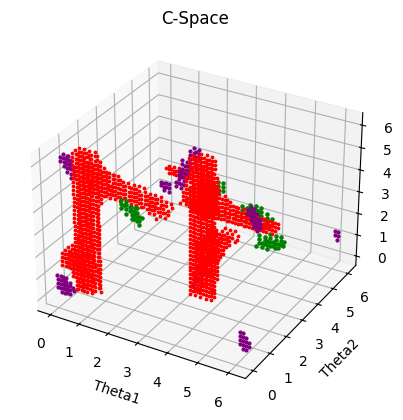

In [30]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax = plot_collision_3d(ax, collision_array, angles, obstacle_colors, opacity=1)
plt.title('C-Space')
plt.show()

Goal point indices (i, j, k): 8, 32, 10
Path found with 8 waypoints. Path length: 42.83


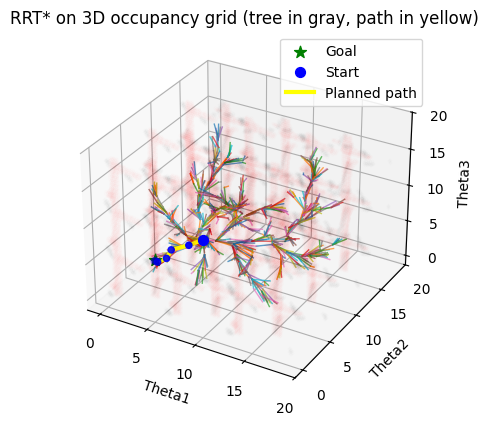

In [12]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax = plot_collision_3d(ax, tiled, angles, obstacle_colors, opacity=0.005)

start = (sx, sy, sz)
tree, path, goal_pt = rrt_star(
    tiled, start=start,
    max_iters=500000, step_size=2, search_radius=10.0, goal_sample_rate=0.01
)

len_angles = len(angles)

# Convert goal_pt to integer indices
i, j, k = goal_pt.astype(int)
print(f"Goal point indices (i, j, k): {i}, {j}, {k}")

# Use the angle values corresponding to the indices in goal_pt, handling angles > 2*pi
plot_goal_x = angles[i % len_angles] + 2 * np.pi * (i // len_angles)
plot_goal_y = angles[j % len_angles] + 2 * np.pi * (j // len_angles)
plot_goal_z = angles[k % len_angles] + 2 * np.pi * (k // len_angles)
ax.scatter(plot_goal_x, plot_goal_y, plot_goal_z, color='green', s=80, marker='*', label='Goal')

# Use the angle values corresponding to the indices in start, handling angles > 2*pi
plot_start_x = angles[int(start[0]) % len_angles] + 2 * np.pi * (int(start[0]) // len_angles)
plot_start_y = angles[int(start[1]) % len_angles] + 2 * np.pi * (int(start[1]) // len_angles)
plot_start_z = angles[int(start[2]) % len_angles] + 2 * np.pi * (int(start[2]) // len_angles)
ax.scatter([plot_start_x], [plot_start_y], [plot_start_z], color='blue', s=50, marker='o', label='Start')

for node in tree:
    if node.parent is None:
        continue
    p = node.pt
    q = tree[node.parent].pt

    # Use angle values for plotting the tree, handling angles > 2*pi
    plot_p_x = angles[int(p[0]) % len_angles] + 2 * np.pi * (int(p[0]) // len_angles)
    plot_p_y = angles[int(p[1]) % len_angles] + 2 * np.pi * (int(p[1]) // len_angles)
    plot_p_z = angles[int(p[2]) % len_angles] + 2 * np.pi * (int(p[2]) // len_angles)

    plot_q_x = angles[int(q[0]) % len_angles] + 2 * np.pi * (int(q[0]) // len_angles)
    plot_q_y = angles[int(q[1]) % len_angles] + 2 * np.pi * (int(q[1]) // len_angles)
    plot_q_z = angles[int(q[2]) % len_angles] + 2 * np.pi * (int(q[2]) // len_angles)

    ax.plot([plot_p_x, plot_q_x], [plot_p_y, plot_q_y], [plot_p_z, plot_q_z], linewidth=1, alpha=0.7)

if path is not None:
    path = np.array(path)
    # Use angle values for plotting the path, handling angles > 2*pi
    plot_path_x = angles[path[:,0].astype(int) % len_angles] + 2 * np.pi * (path[:,0].astype(int) // len_angles)
    plot_path_y = angles[path[:,1].astype(int) % len_angles] + 2 * np.pi * (path[:,1].astype(int) // len_angles)
    plot_path_z = angles[path[:,2].astype(int) % len_angles] + 2 * np.pi * (path[:,2].astype(int) // len_angles)

    ax.plot(plot_path_x, plot_path_y, plot_path_z, linewidth=3, color='yellow', label='Planned path')
    ax.scatter(plot_path_x, plot_path_y, plot_path_z, color='blue', s=20)
    print(f"Path found with {len(path)} waypoints. Path length: {sum(np.linalg.norm(path[i+1]-path[i]) for i in range(len(path)-1)):.2f}")
else:
    print("No path found within iteration limit.")

# ax.set_xlabel('X'); ax.set_ylabel('Y'); ax.set_zlabel('Z')
ax.legend()
plt.title('RRT* on 3D occupancy grid (tree in gray, path in yellow)')
plt.show()

In [10]:
path

array([[35.        , 35.        , 35.        ],
       [35.28119877, 32.78285577, 32.25048471],
       [31.65559681, 27.67999979, 25.64416553],
       [24.85138961, 25.49231681, 19.27549085],
       [23.19168574, 26.13326259, 18.36194197],
       [14.33568036, 28.60320651, 14.43445976],
       [ 8.89678684, 31.22787976, 10.29853372],
       [ 8.        , 32.        , 10.        ]])

In [13]:
# for i, waypoint in enumerate(path):
#     # Extract the angle indices from the waypoint
#     yaw_idx, pitch_idx, joint_angle_idx = waypoint.astype(int)

#     # Convert indices to actual angle values using the 'angles' array
#     current_yaw = angles[yaw_idx]
#     current_pitch = angles[pitch_idx]
#     current_joint_angle = angles[joint_angle_idx]

#     print(f"Plotting waypoint {i+1}/{len(path)}: Yaw={np.degrees(current_yaw):.1f} deg, Pitch={np.degrees(current_pitch):.1f} deg, Joint Angle={np.degrees(current_joint_angle):.1f} deg")
#     # Plot the arm configuration for the current waypoint
#     plot_arm_and_obstacles(link_len, current_yaw, current_pitch, current_joint_angle, obstacles)


Starting collision check for interpolated paths between waypoints...

--- Checking segment from Waypoint 1 to Waypoint 2 ---
  Interpolated point 1/5: Yaw=360.0 deg, Pitch=360.0 deg, Joint Angle=360.0 deg


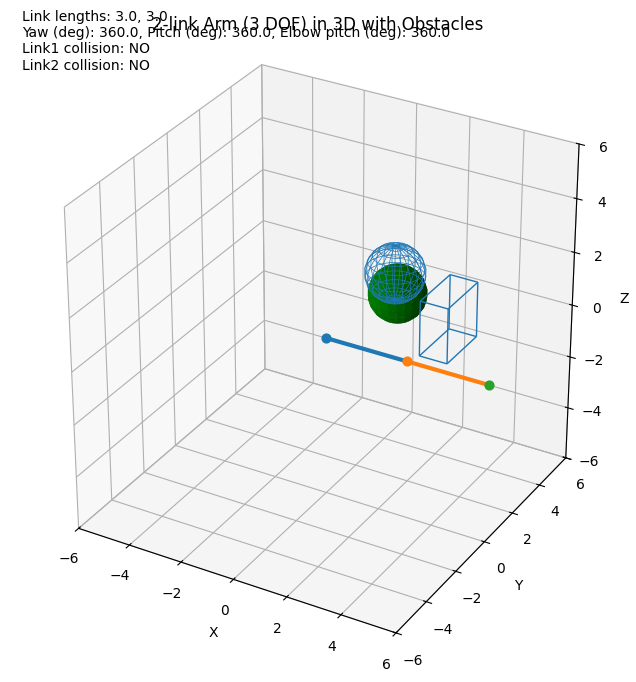

  Interpolated point 2/5: Yaw=351.9 deg, Pitch=360.1 deg, Joint Angle=354.5 deg


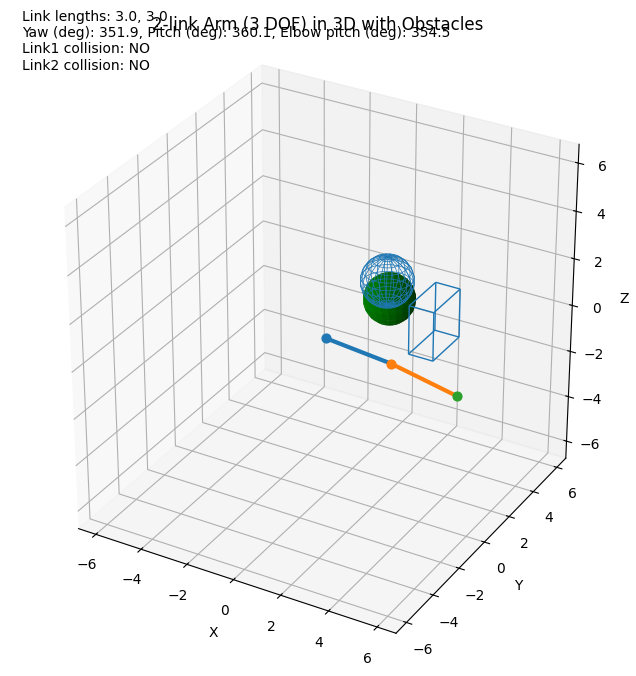

  Interpolated point 3/5: Yaw=343.8 deg, Pitch=360.3 deg, Joint Angle=349.1 deg


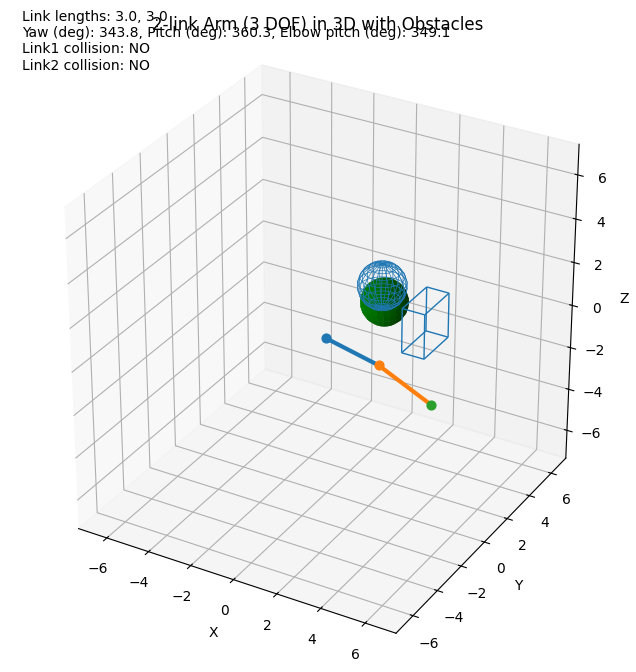

  Interpolated point 4/5: Yaw=335.7 deg, Pitch=360.4 deg, Joint Angle=343.6 deg


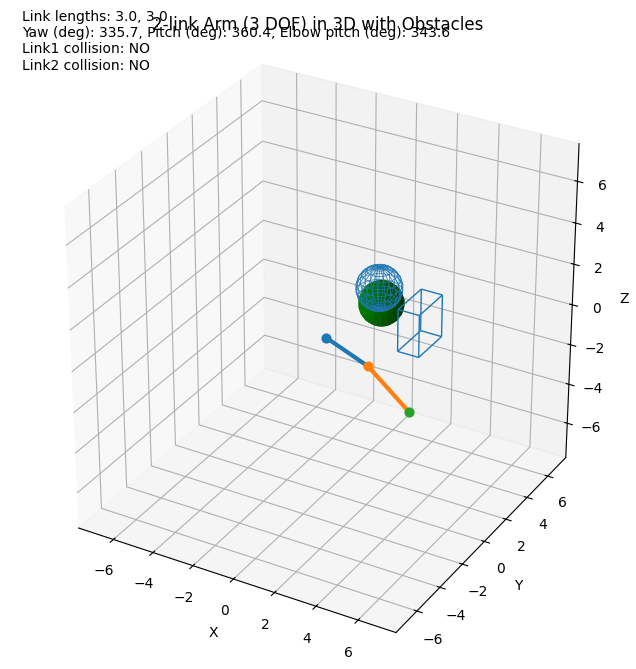

  Interpolated point 5/5: Yaw=327.6 deg, Pitch=360.6 deg, Joint Angle=338.1 deg


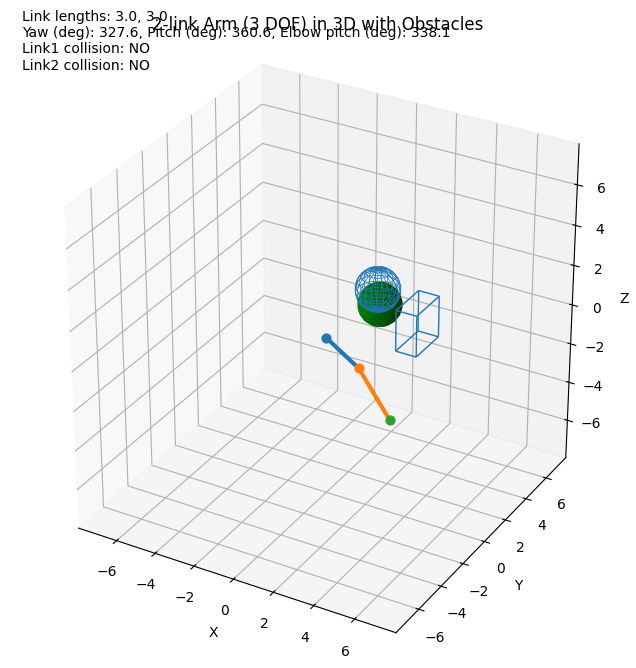


--- Checking segment from Waypoint 2 to Waypoint 3 ---
  Interpolated point 1/5: Yaw=327.6 deg, Pitch=360.6 deg, Joint Angle=338.1 deg


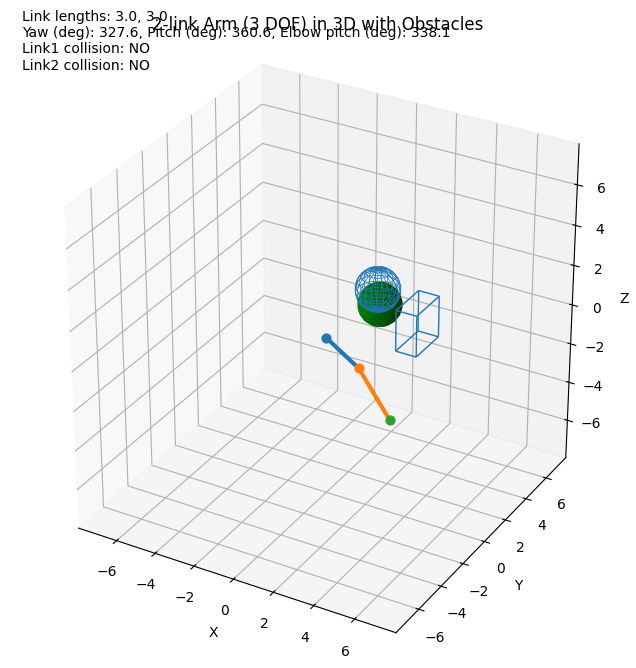

  Interpolated point 2/5: Yaw=324.2 deg, Pitch=360.0 deg, Joint Angle=334.7 deg


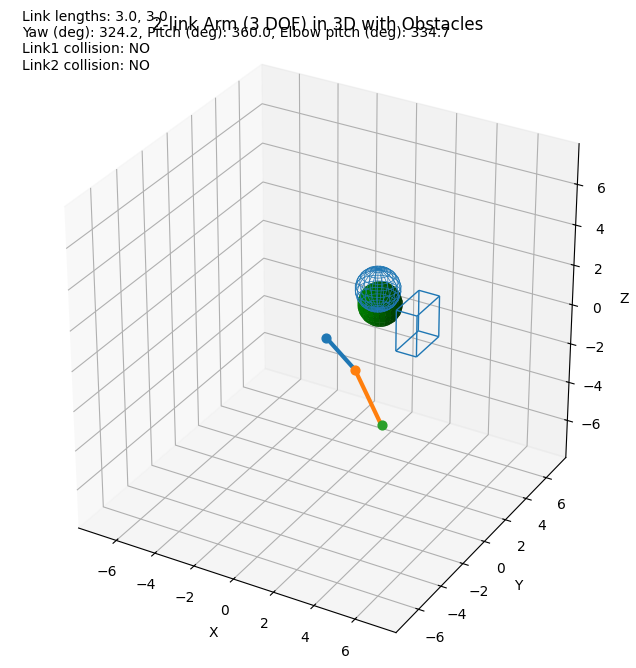

  Interpolated point 3/5: Yaw=320.7 deg, Pitch=359.4 deg, Joint Angle=331.3 deg


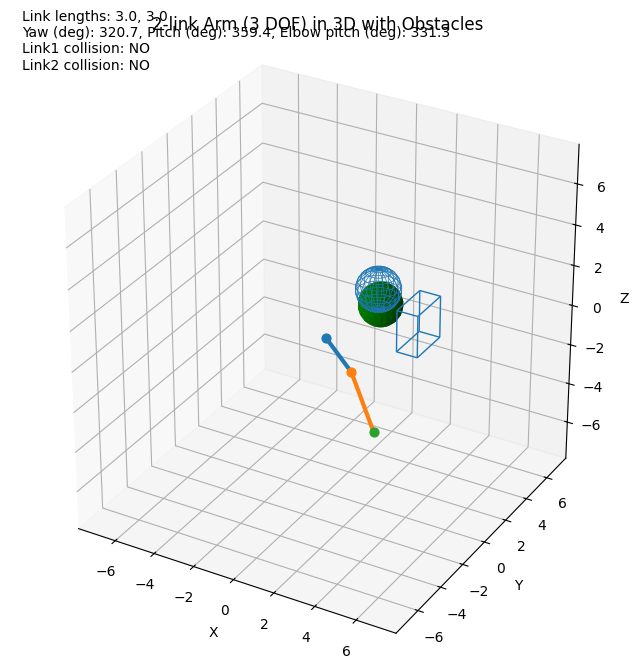

  Interpolated point 4/5: Yaw=317.3 deg, Pitch=358.8 deg, Joint Angle=327.9 deg


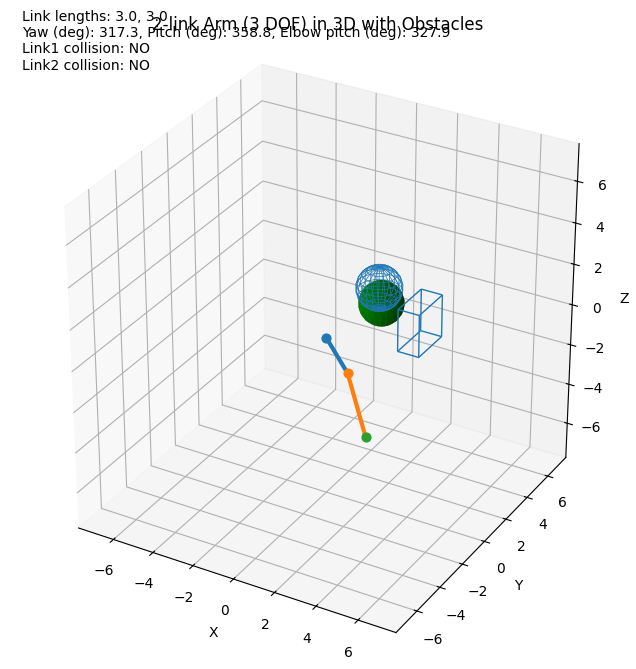

  Interpolated point 5/5: Yaw=313.9 deg, Pitch=358.2 deg, Joint Angle=324.5 deg


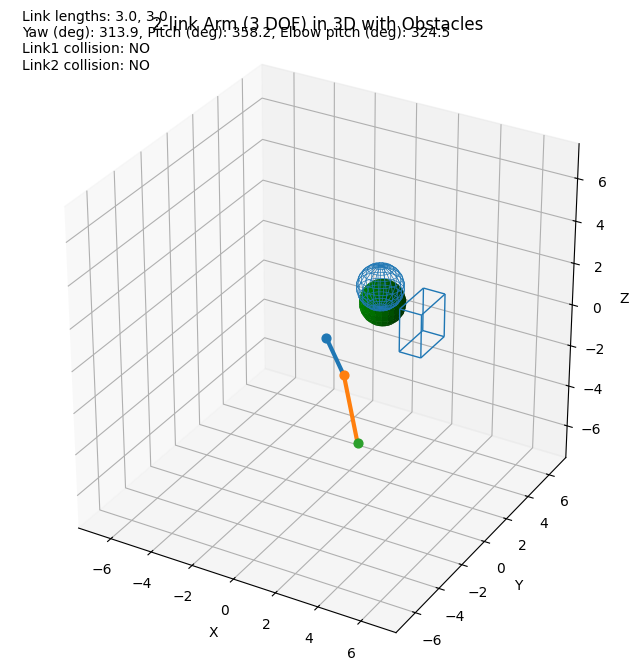


--- Checking segment from Waypoint 3 to Waypoint 4 ---
  Interpolated point 1/5: Yaw=313.9 deg, Pitch=358.2 deg, Joint Angle=324.5 deg


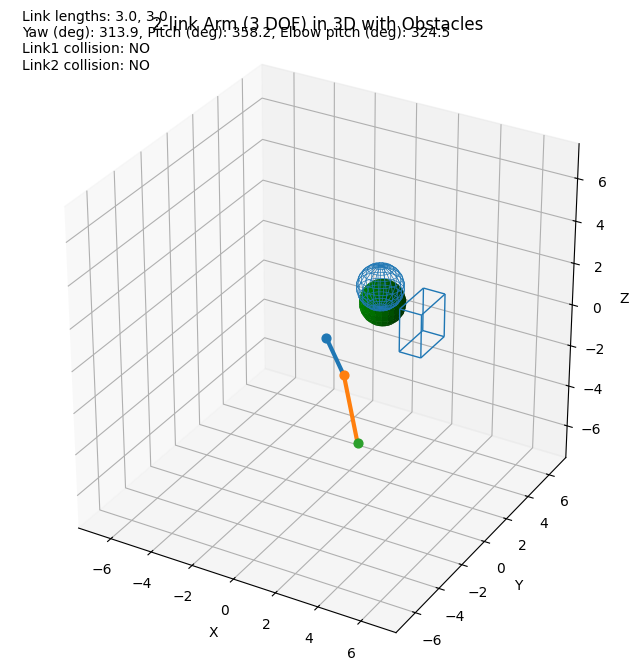

  Interpolated point 2/5: Yaw=307.2 deg, Pitch=363.0 deg, Joint Angle=320.2 deg


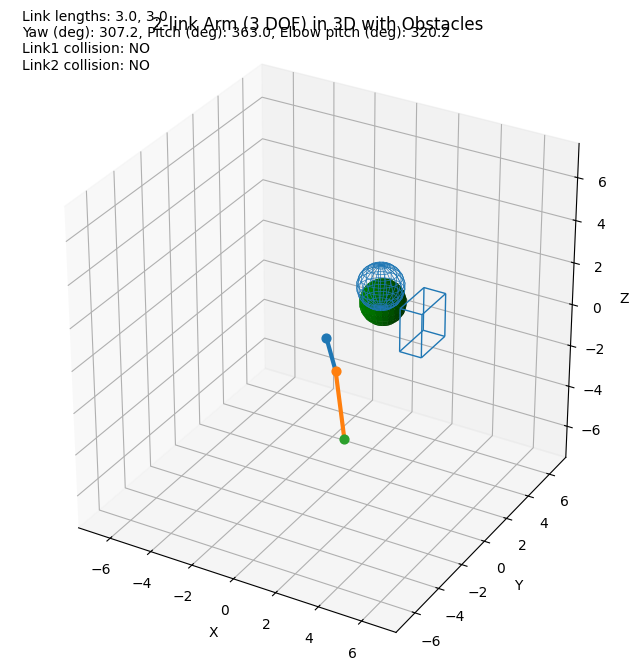

  Interpolated point 3/5: Yaw=300.6 deg, Pitch=367.8 deg, Joint Angle=315.9 deg


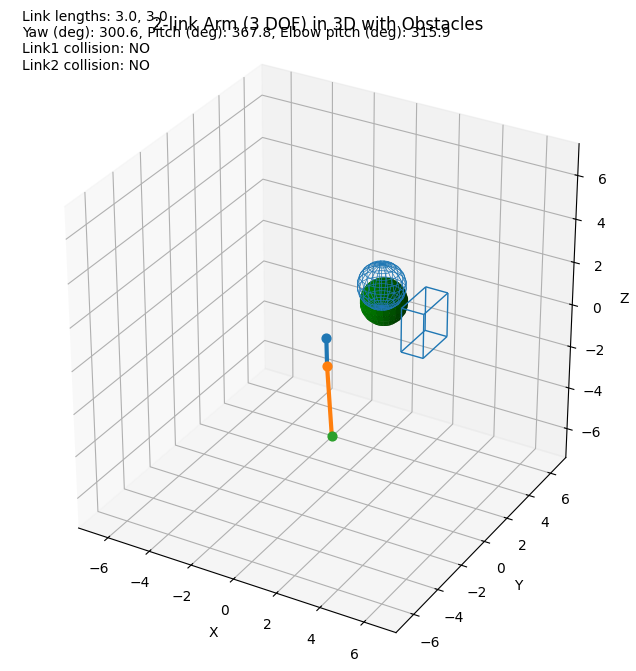

  Interpolated point 4/5: Yaw=293.9 deg, Pitch=372.6 deg, Joint Angle=311.6 deg


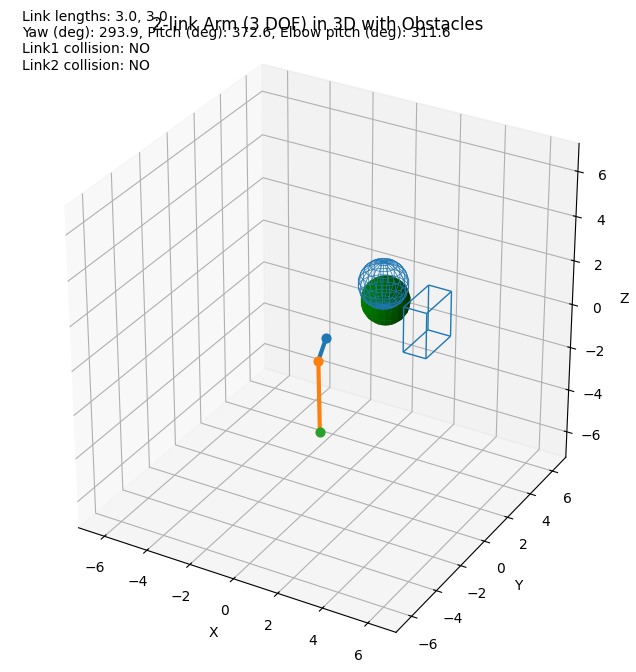

  Interpolated point 5/5: Yaw=287.3 deg, Pitch=377.4 deg, Joint Angle=307.3 deg


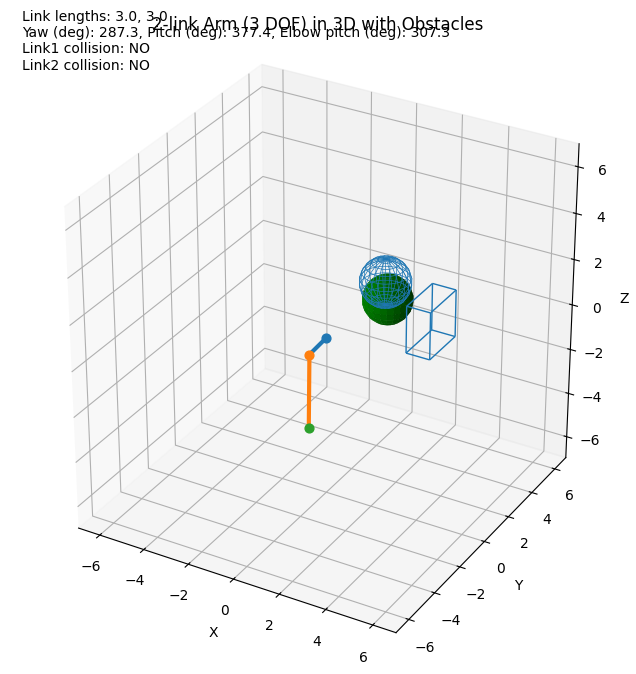


--- Checking segment from Waypoint 4 to Waypoint 5 ---
  Interpolated point 1/5: Yaw=287.3 deg, Pitch=377.4 deg, Joint Angle=307.3 deg


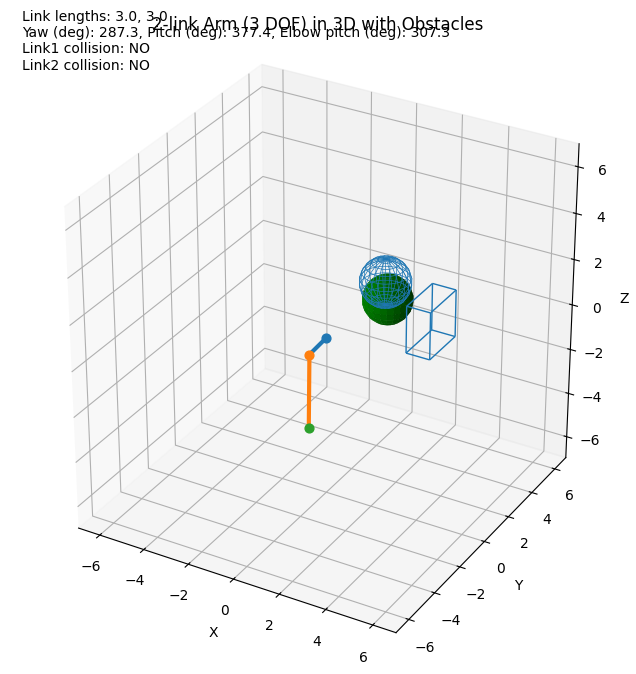

  Interpolated point 2/5: Yaw=284.0 deg, Pitch=380.2 deg, Joint Angle=296.8 deg


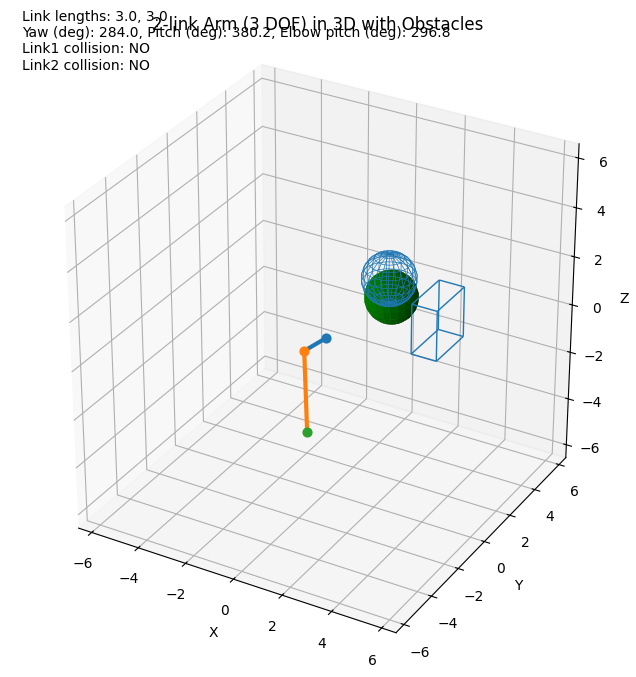

  Interpolated point 3/5: Yaw=280.8 deg, Pitch=383.1 deg, Joint Angle=286.4 deg


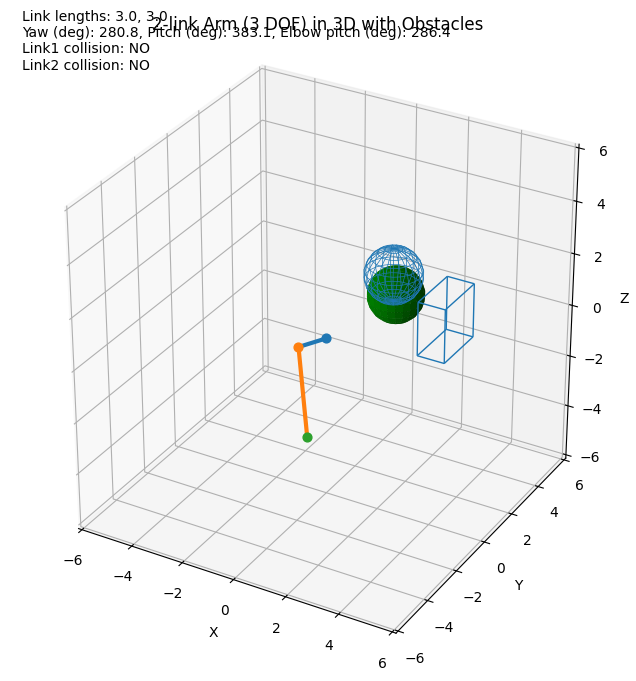

  Interpolated point 4/5: Yaw=277.5 deg, Pitch=386.0 deg, Joint Angle=275.9 deg


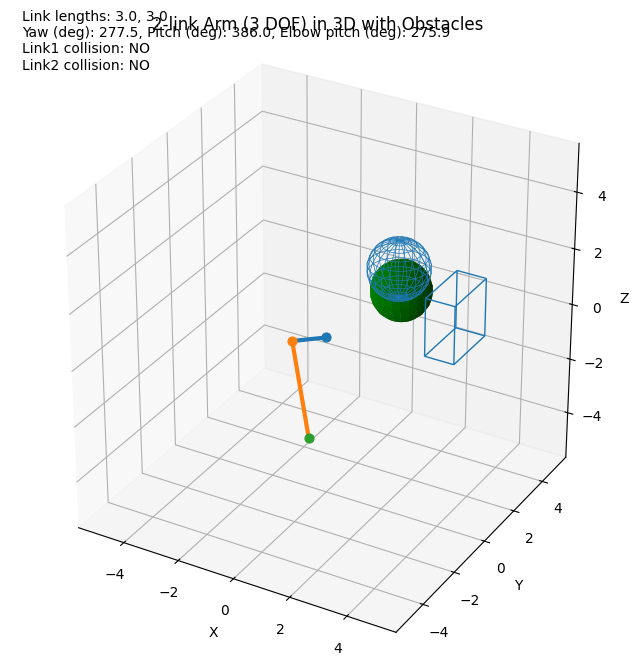

  Interpolated point 5/5: Yaw=274.2 deg, Pitch=388.9 deg, Joint Angle=265.5 deg


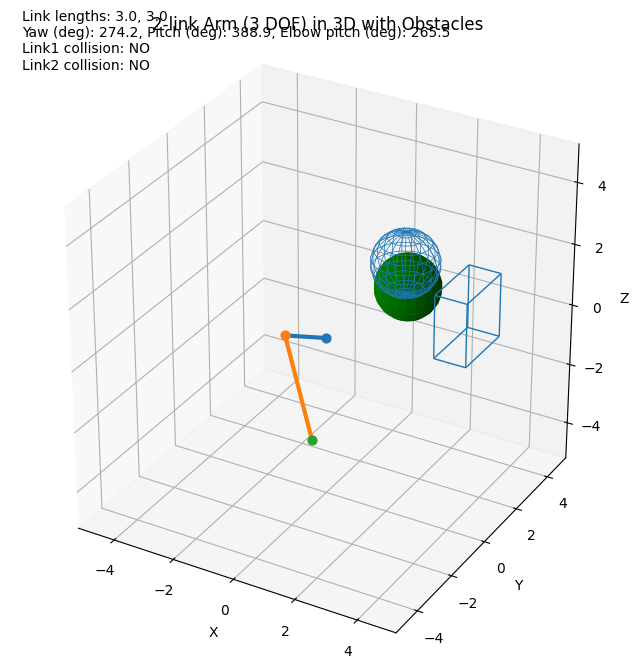


--- Checking segment from Waypoint 5 to Waypoint 6 ---
  Interpolated point 1/5: Yaw=274.2 deg, Pitch=388.9 deg, Joint Angle=265.5 deg


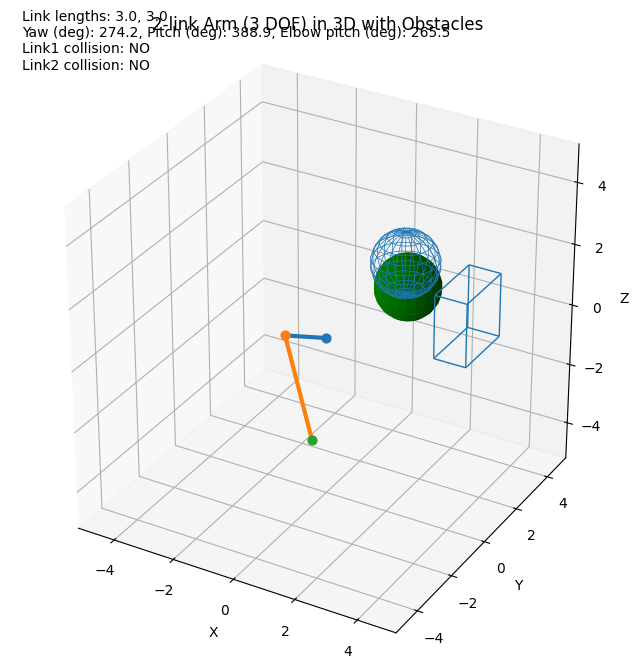

  Interpolated point 2/5: Yaw=268.7 deg, Pitch=390.7 deg, Joint Angle=258.2 deg


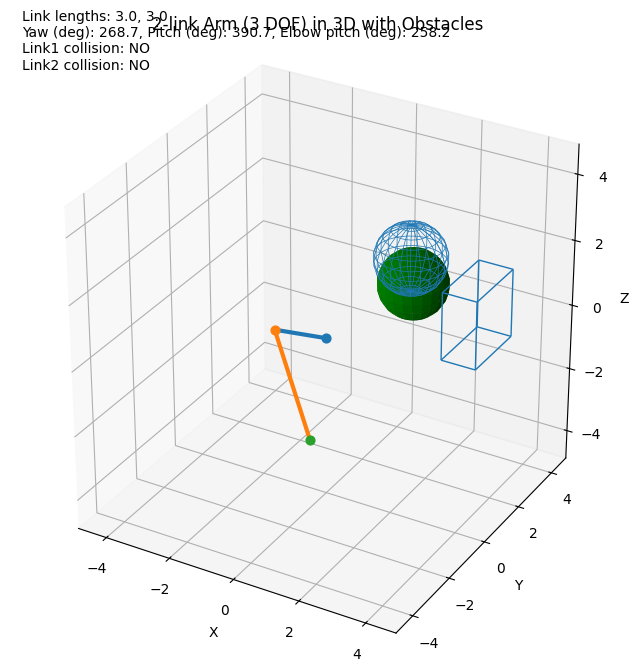

  Interpolated point 3/5: Yaw=263.3 deg, Pitch=392.4 deg, Joint Angle=251.0 deg


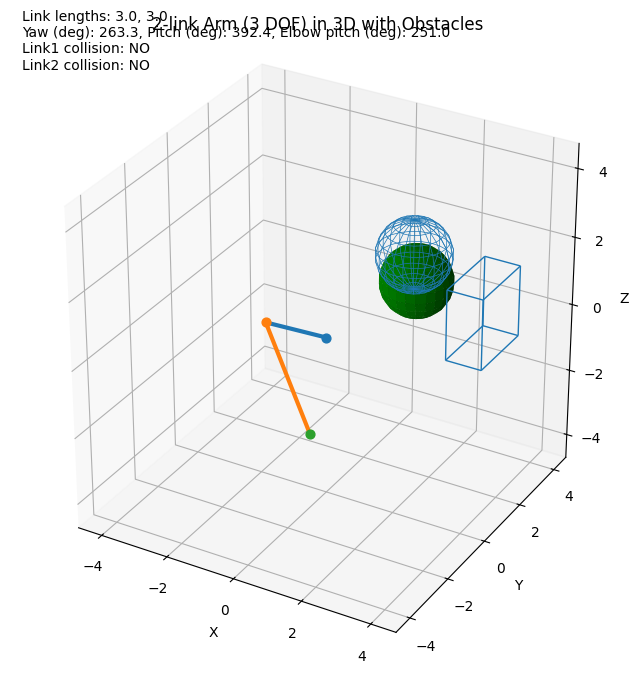

  Interpolated point 4/5: Yaw=257.8 deg, Pitch=394.2 deg, Joint Angle=243.7 deg


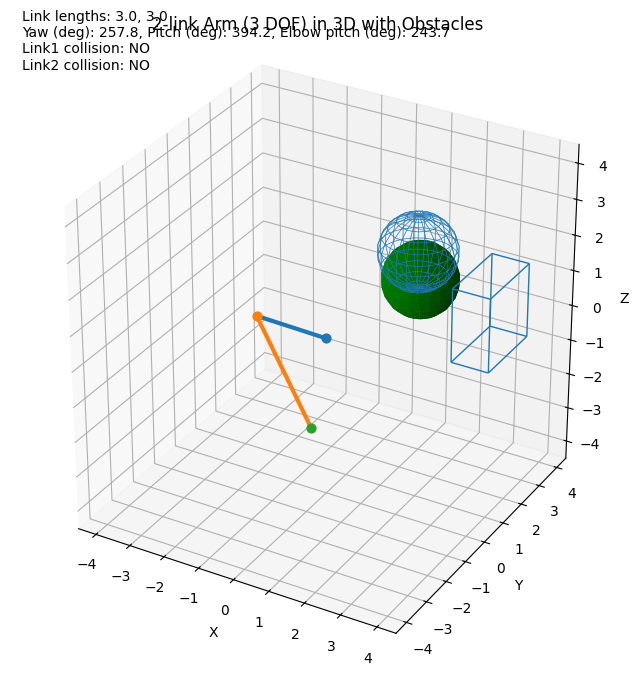

  Interpolated point 5/5: Yaw=252.3 deg, Pitch=396.0 deg, Joint Angle=236.4 deg


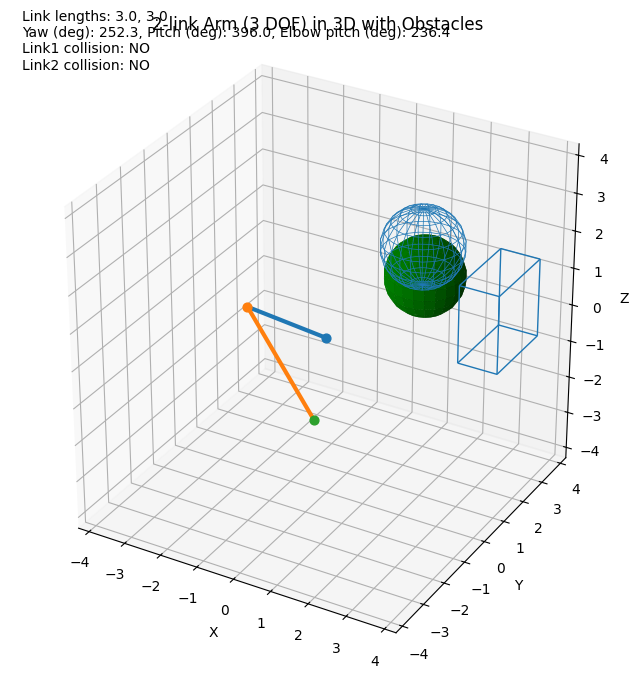


--- Checking segment from Waypoint 6 to Waypoint 7 ---
  Interpolated point 1/5: Yaw=252.3 deg, Pitch=396.0 deg, Joint Angle=236.4 deg


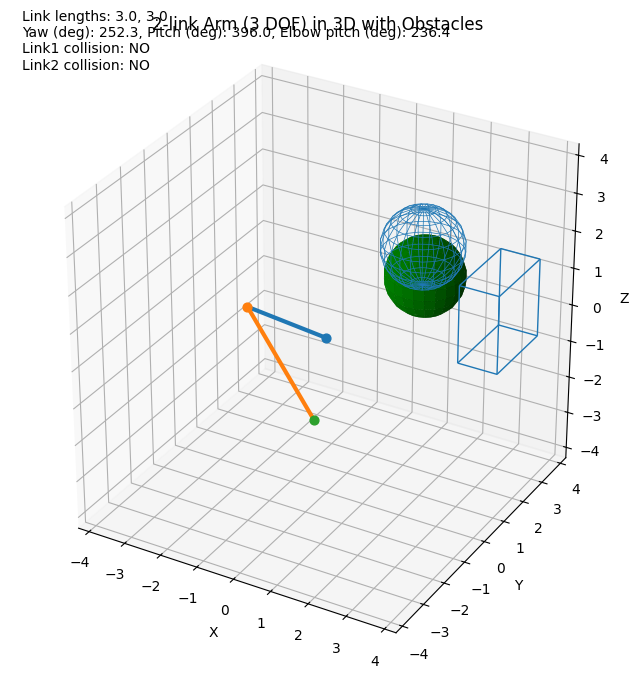

  Interpolated point 2/5: Yaw=245.5 deg, Pitch=399.7 deg, Joint Angle=234.8 deg


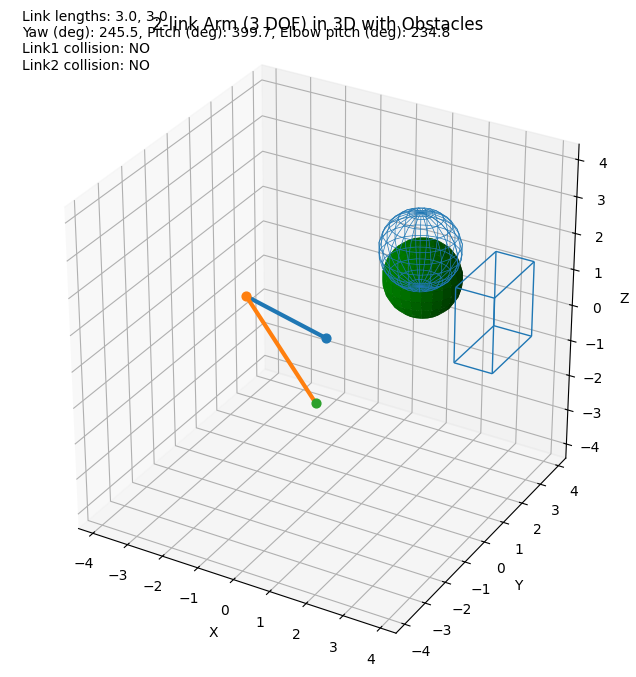

  Interpolated point 3/5: Yaw=238.8 deg, Pitch=403.4 deg, Joint Angle=233.2 deg


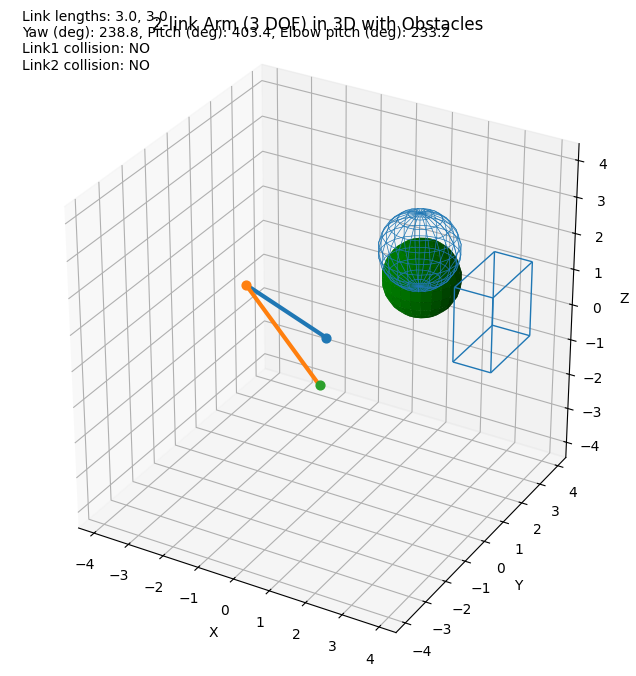

  Interpolated point 4/5: Yaw=232.0 deg, Pitch=407.1 deg, Joint Angle=231.6 deg


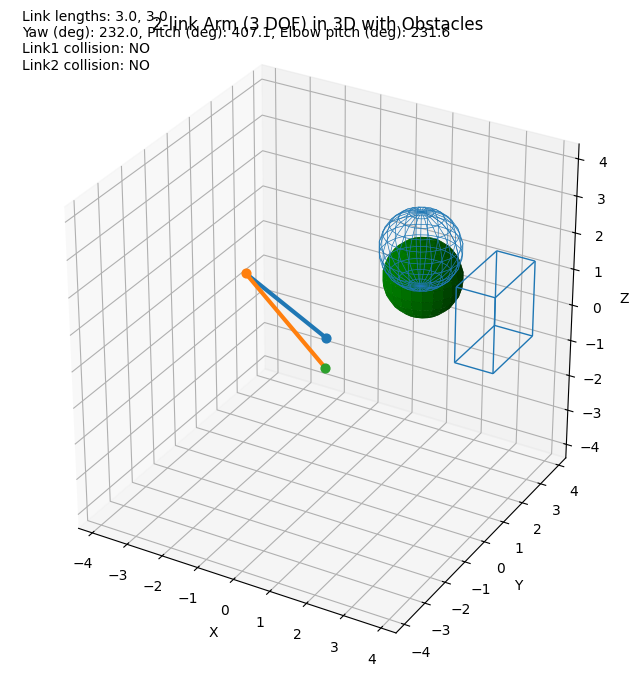

  Interpolated point 5/5: Yaw=225.3 deg, Pitch=410.8 deg, Joint Angle=230.0 deg


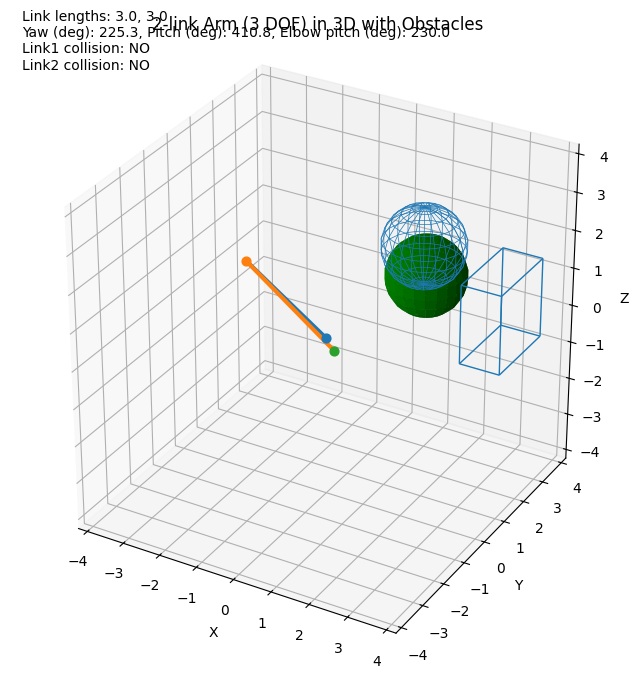


--- Checking segment from Waypoint 7 to Waypoint 8 ---
  Interpolated point 1/5: Yaw=225.3 deg, Pitch=410.8 deg, Joint Angle=230.0 deg


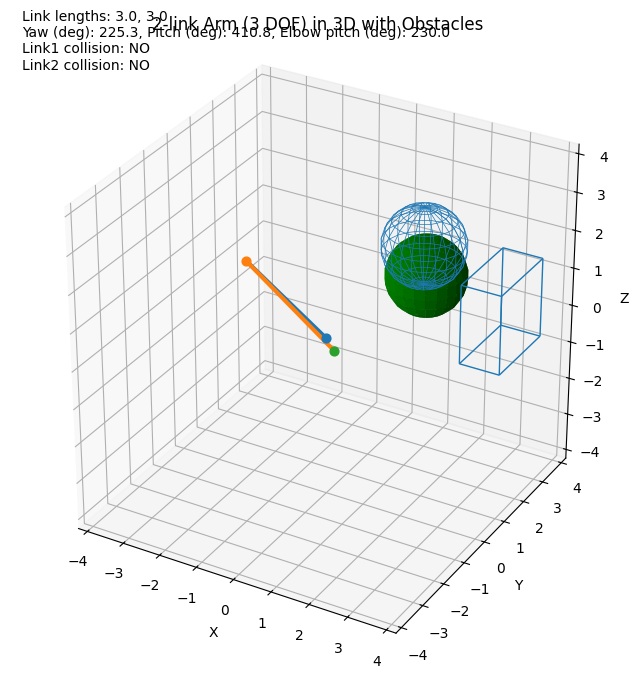

  Interpolated point 2/5: Yaw=216.4 deg, Pitch=409.6 deg, Joint Angle=221.6 deg


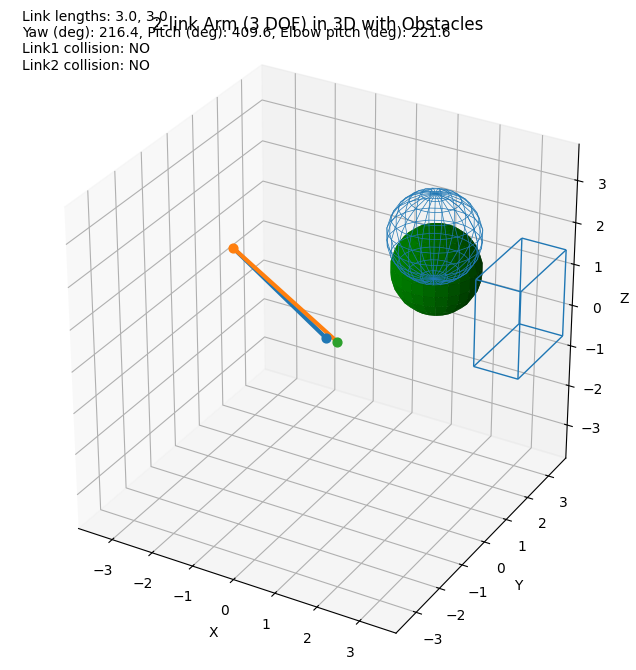

  Interpolated point 3/5: Yaw=207.6 deg, Pitch=408.4 deg, Joint Angle=213.2 deg


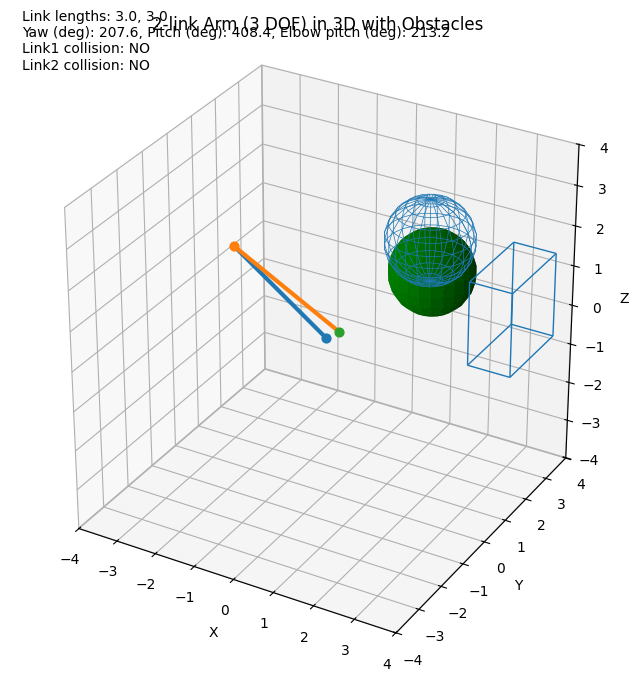

  Interpolated point 4/5: Yaw=198.7 deg, Pitch=407.2 deg, Joint Angle=204.8 deg


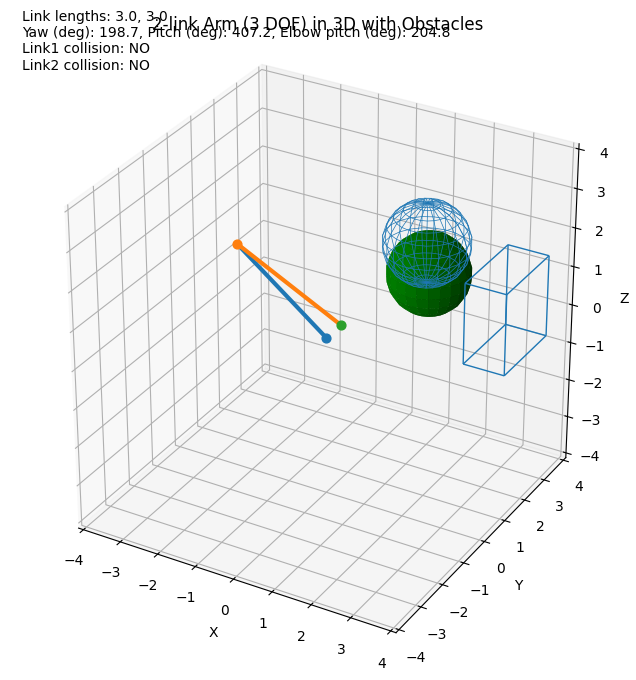

  Interpolated point 5/5: Yaw=189.8 deg, Pitch=406.0 deg, Joint Angle=196.4 deg


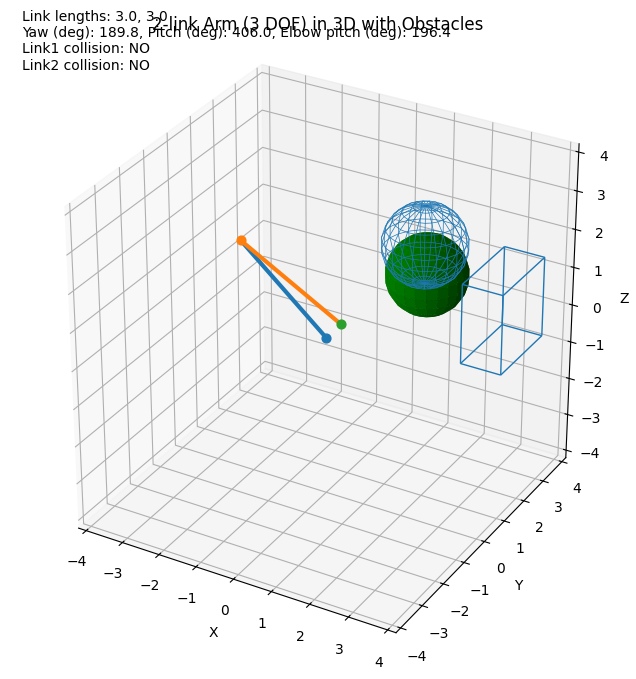


--- Checking segment from Waypoint 8 to Waypoint 9 ---
  Interpolated point 1/5: Yaw=189.8 deg, Pitch=406.0 deg, Joint Angle=196.4 deg


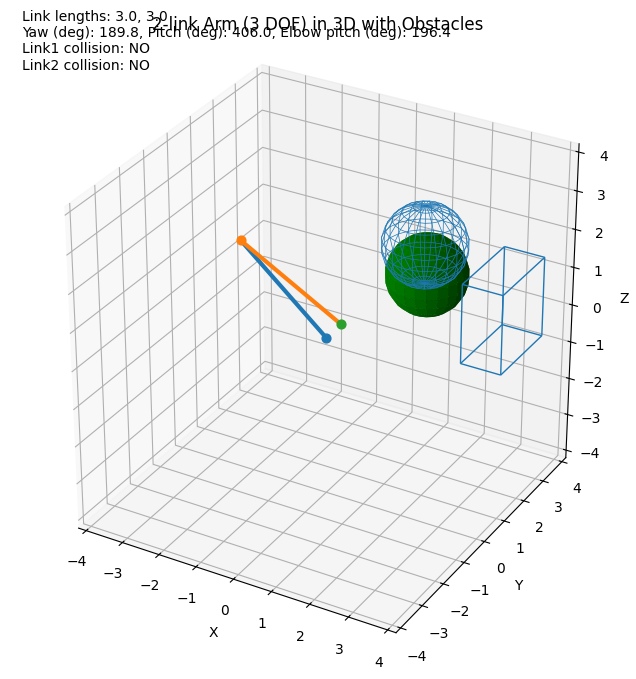

  Interpolated point 2/5: Yaw=186.3 deg, Pitch=403.7 deg, Joint Angle=193.5 deg


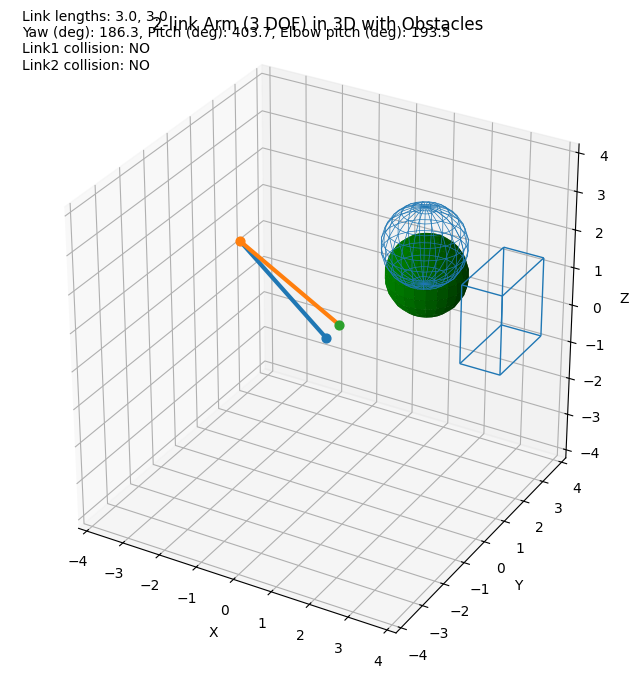

  Interpolated point 3/5: Yaw=182.7 deg, Pitch=401.4 deg, Joint Angle=190.5 deg


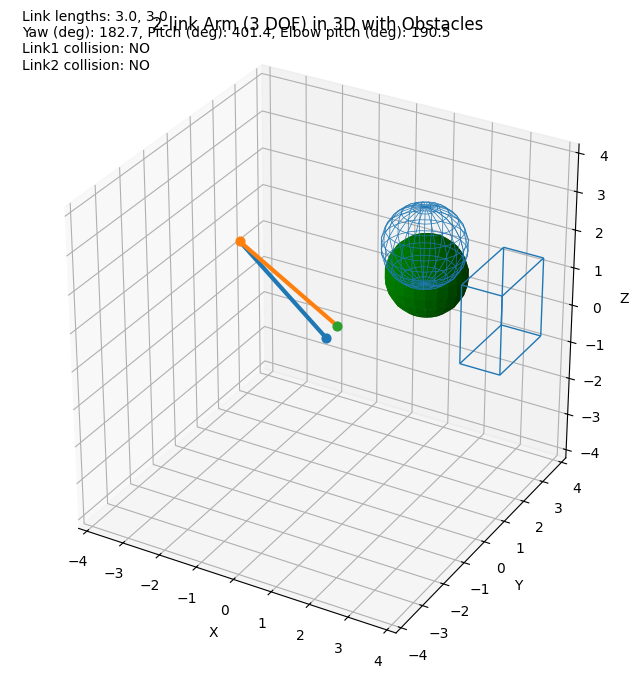

  Interpolated point 4/5: Yaw=179.2 deg, Pitch=399.1 deg, Joint Angle=187.6 deg


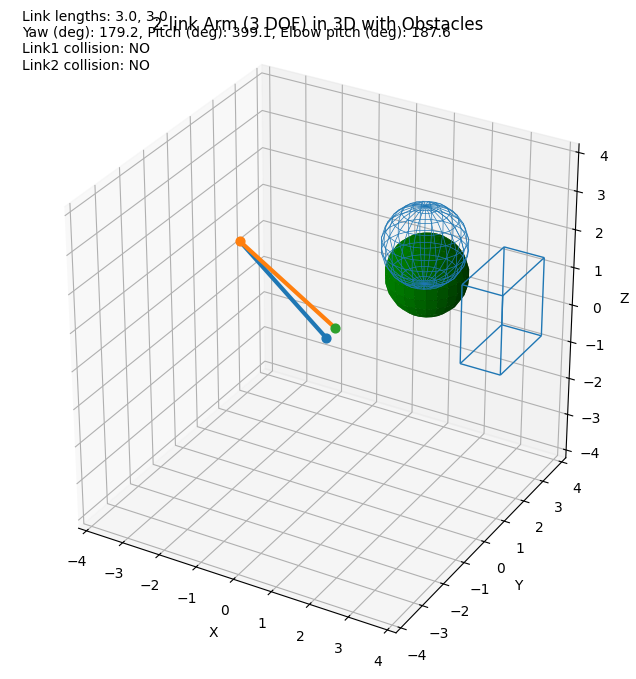

  Interpolated point 5/5: Yaw=175.6 deg, Pitch=396.8 deg, Joint Angle=184.6 deg


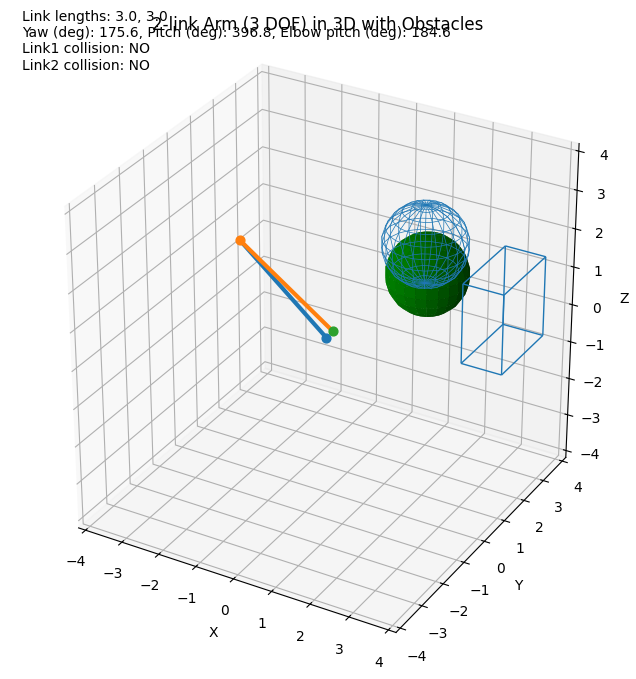


--- Checking segment from Waypoint 9 to Waypoint 10 ---
  Interpolated point 1/5: Yaw=175.6 deg, Pitch=396.8 deg, Joint Angle=184.6 deg


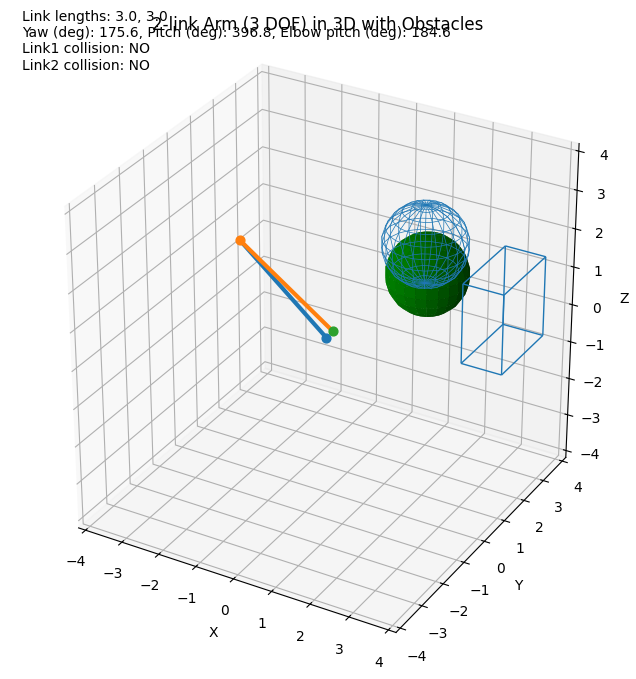

  Interpolated point 2/5: Yaw=172.1 deg, Pitch=394.5 deg, Joint Angle=181.7 deg


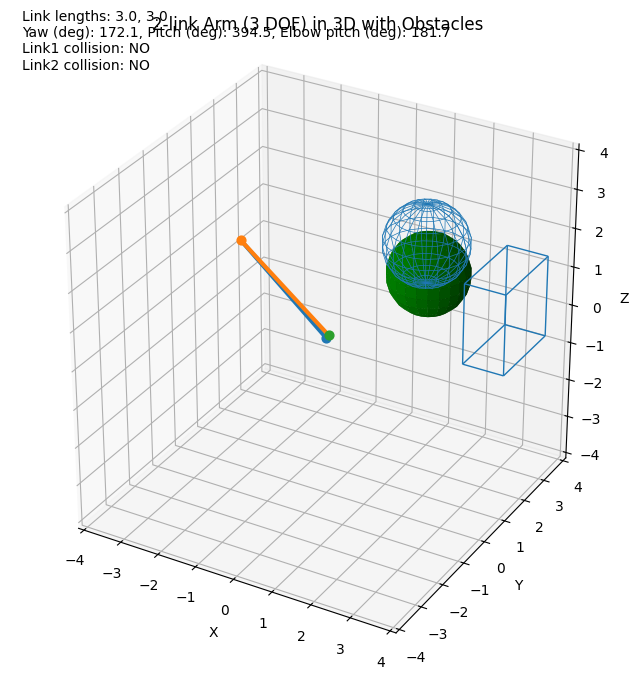

  Interpolated point 3/5: Yaw=168.5 deg, Pitch=392.2 deg, Joint Angle=178.7 deg


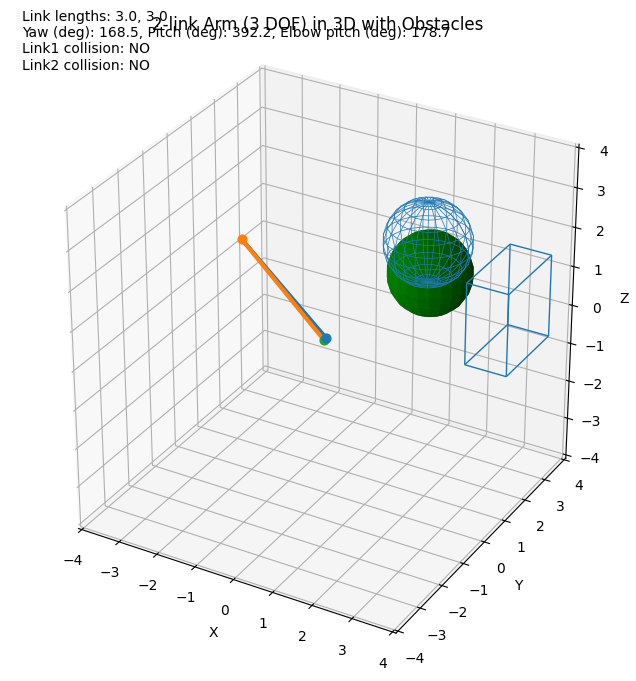

  Interpolated point 4/5: Yaw=165.0 deg, Pitch=389.9 deg, Joint Angle=175.8 deg


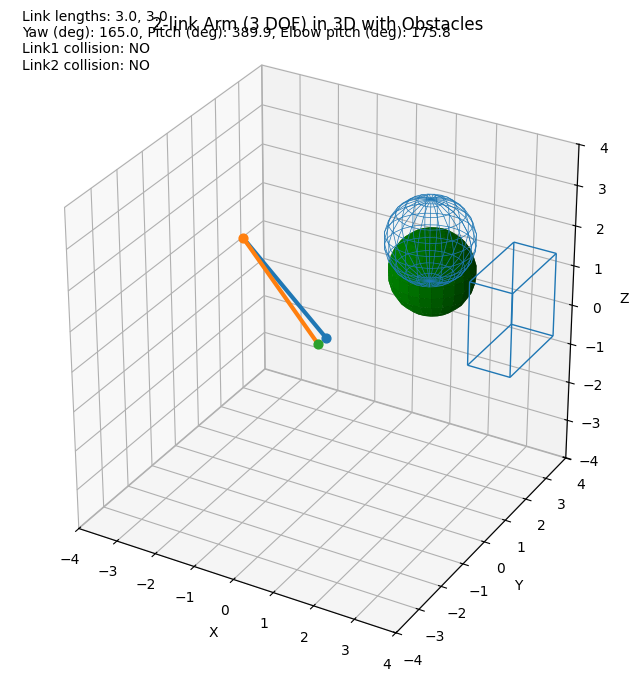

  Interpolated point 5/5: Yaw=161.4 deg, Pitch=387.6 deg, Joint Angle=172.8 deg


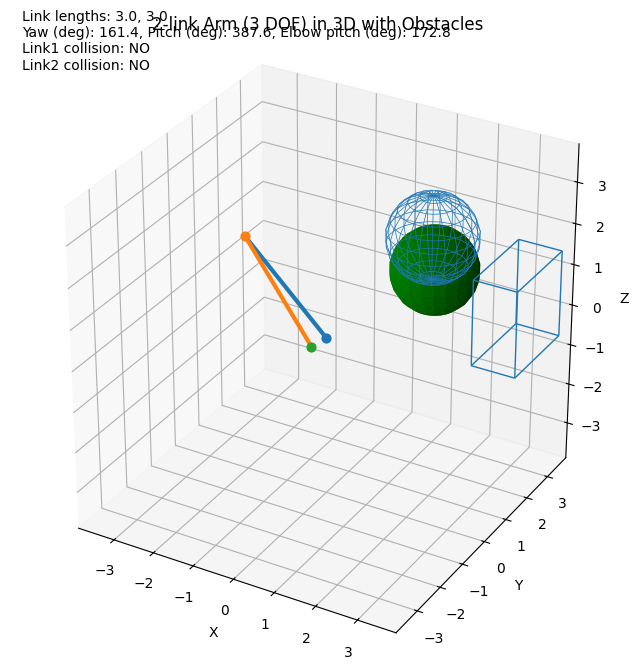


--- Checking segment from Waypoint 10 to Waypoint 11 ---
  Interpolated point 1/5: Yaw=161.4 deg, Pitch=387.6 deg, Joint Angle=172.8 deg


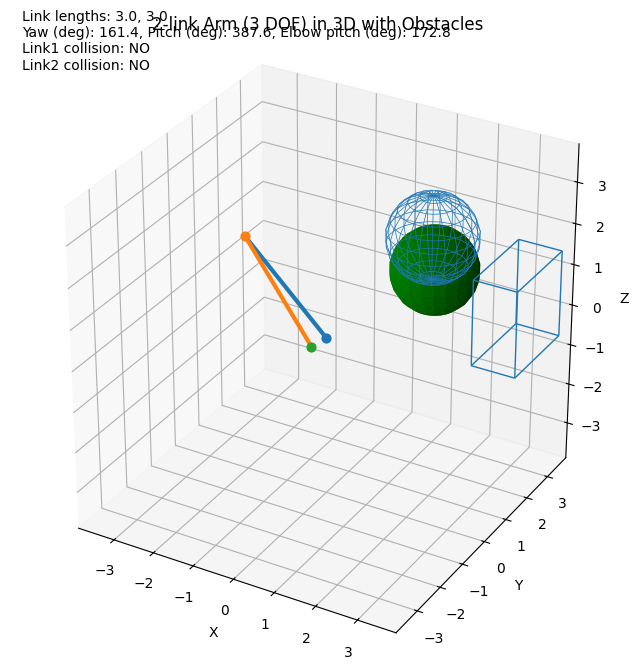

  Interpolated point 2/5: Yaw=157.9 deg, Pitch=385.3 deg, Joint Angle=169.9 deg


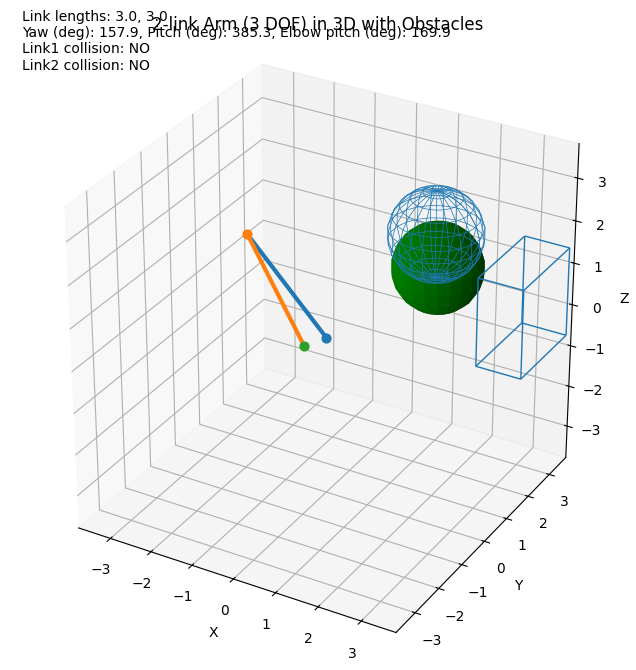

  Interpolated point 3/5: Yaw=154.3 deg, Pitch=383.0 deg, Joint Angle=166.9 deg


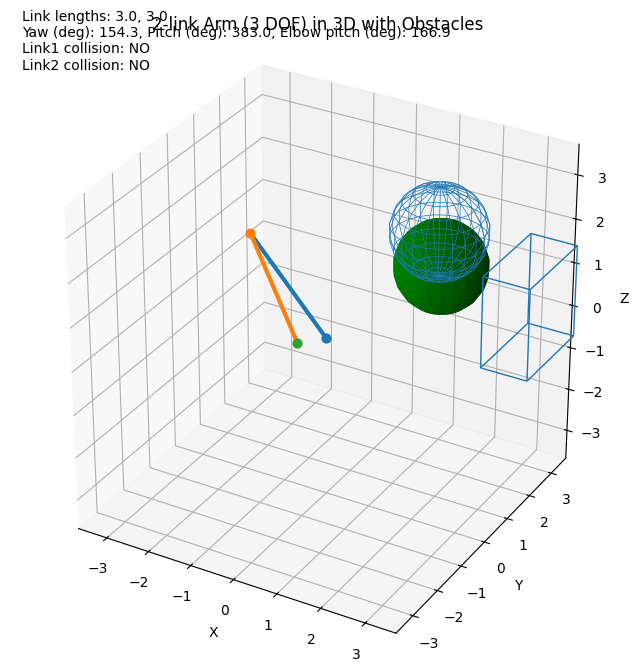

  Interpolated point 4/5: Yaw=150.8 deg, Pitch=380.8 deg, Joint Angle=164.0 deg


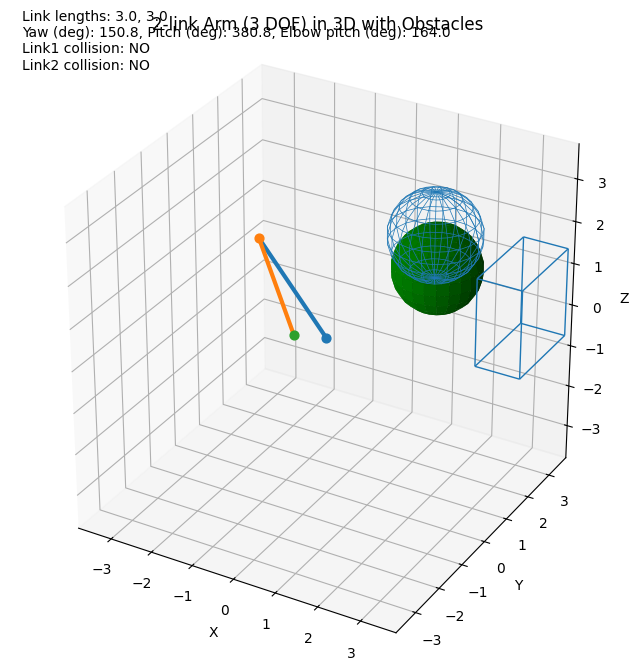

  Interpolated point 5/5: Yaw=147.2 deg, Pitch=378.5 deg, Joint Angle=161.0 deg


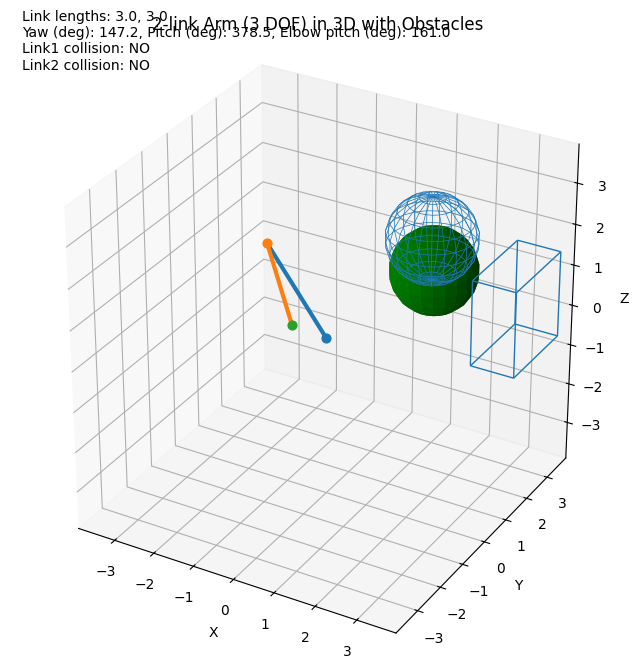


--- Checking segment from Waypoint 11 to Waypoint 12 ---
  Interpolated point 1/5: Yaw=147.2 deg, Pitch=378.5 deg, Joint Angle=161.0 deg


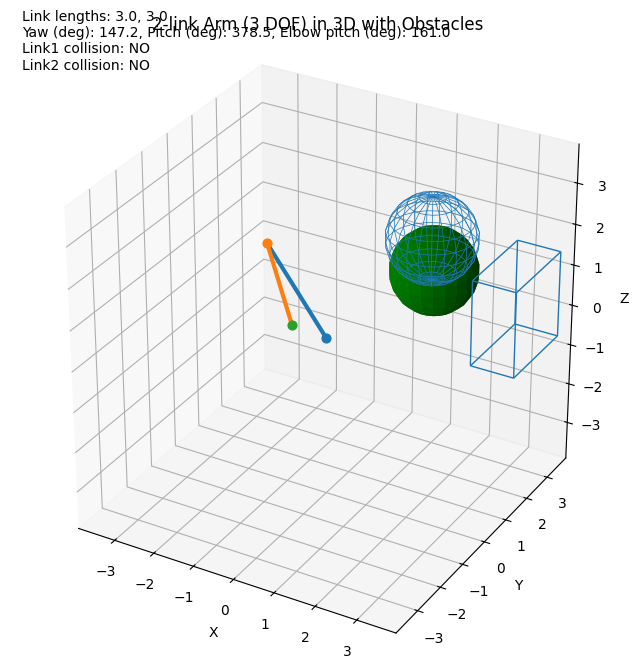

  Interpolated point 2/5: Yaw=143.7 deg, Pitch=376.2 deg, Joint Angle=158.1 deg


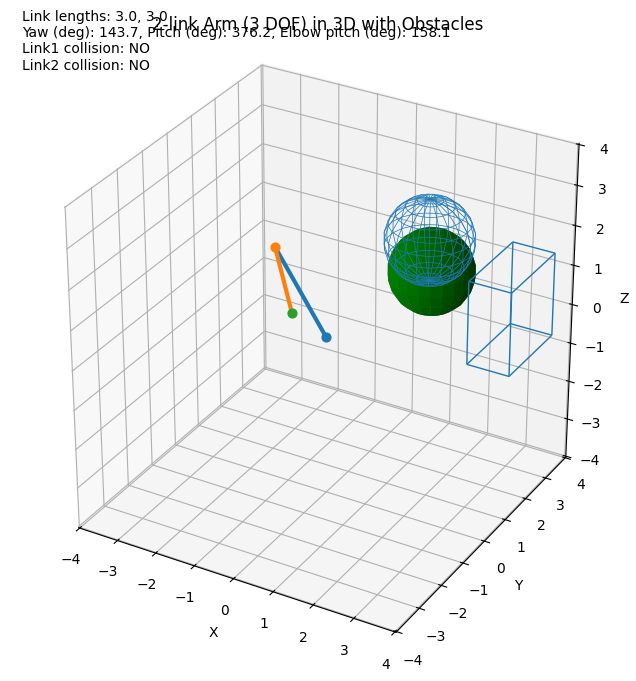

  Interpolated point 3/5: Yaw=140.1 deg, Pitch=373.9 deg, Joint Angle=155.1 deg


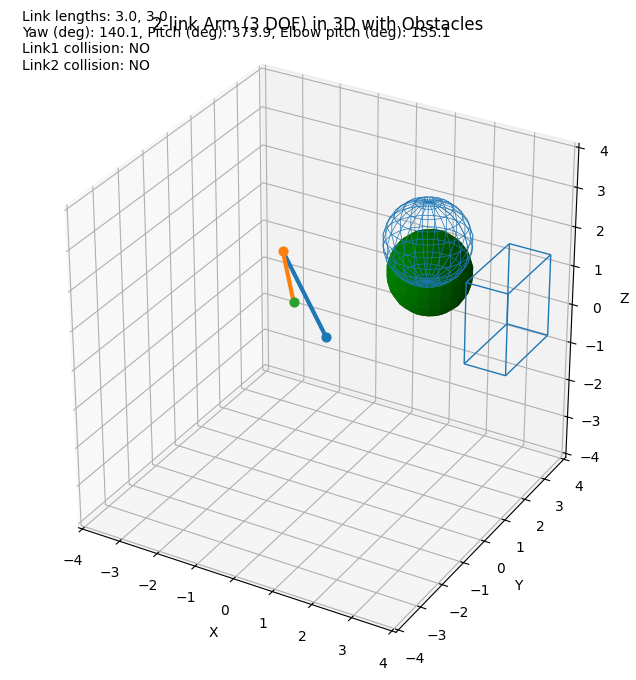

  Interpolated point 4/5: Yaw=136.6 deg, Pitch=371.6 deg, Joint Angle=152.2 deg


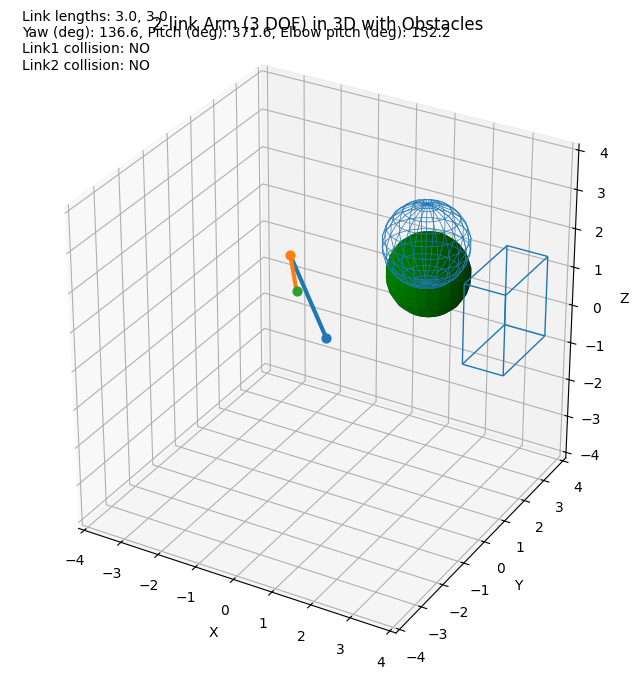

  Interpolated point 5/5: Yaw=133.0 deg, Pitch=369.3 deg, Joint Angle=149.2 deg


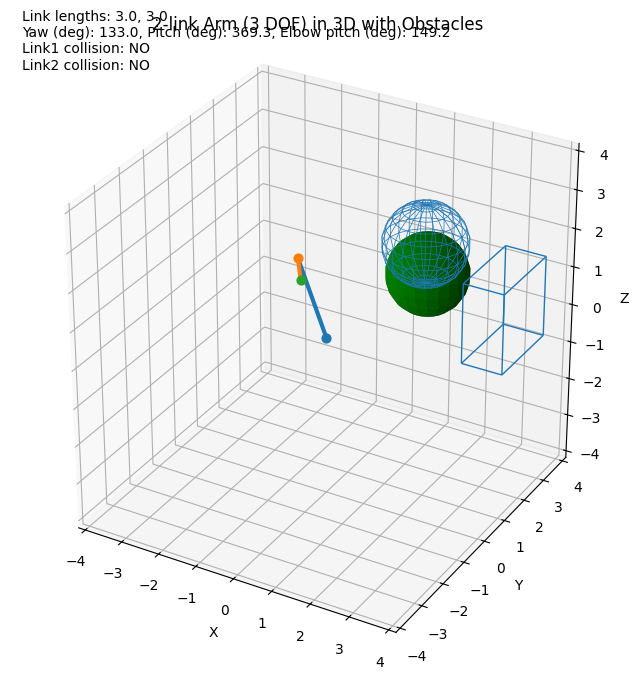


--- Checking segment from Waypoint 12 to Waypoint 13 ---
  Interpolated point 1/5: Yaw=133.0 deg, Pitch=369.3 deg, Joint Angle=149.2 deg


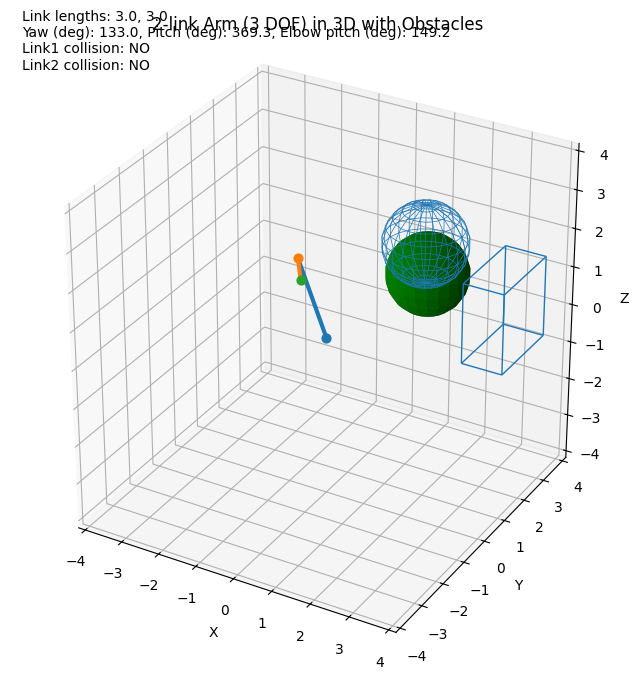

  Interpolated point 2/5: Yaw=127.4 deg, Pitch=361.5 deg, Joint Angle=140.8 deg


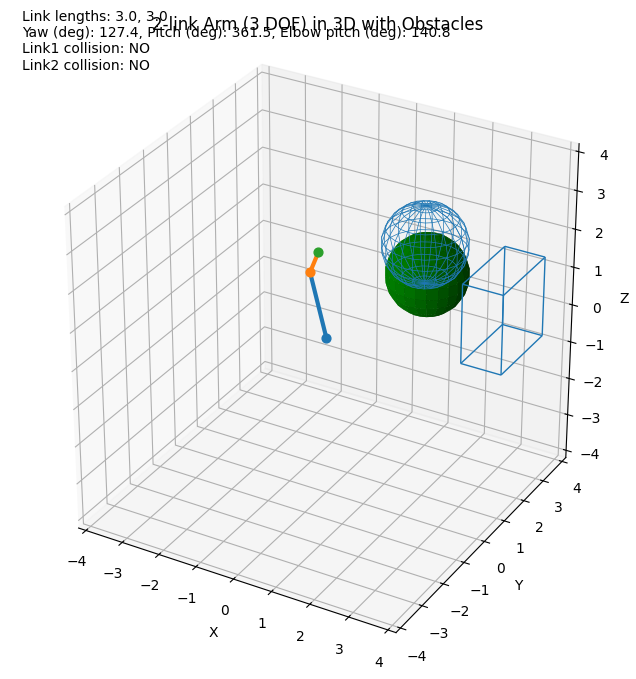

  Interpolated point 3/5: Yaw=121.8 deg, Pitch=353.7 deg, Joint Angle=132.4 deg


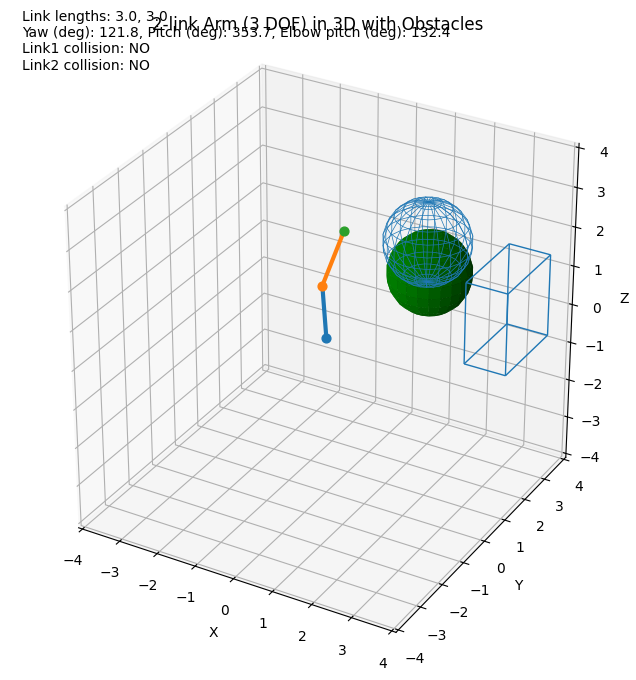

  Interpolated point 4/5: Yaw=116.2 deg, Pitch=345.9 deg, Joint Angle=124.0 deg


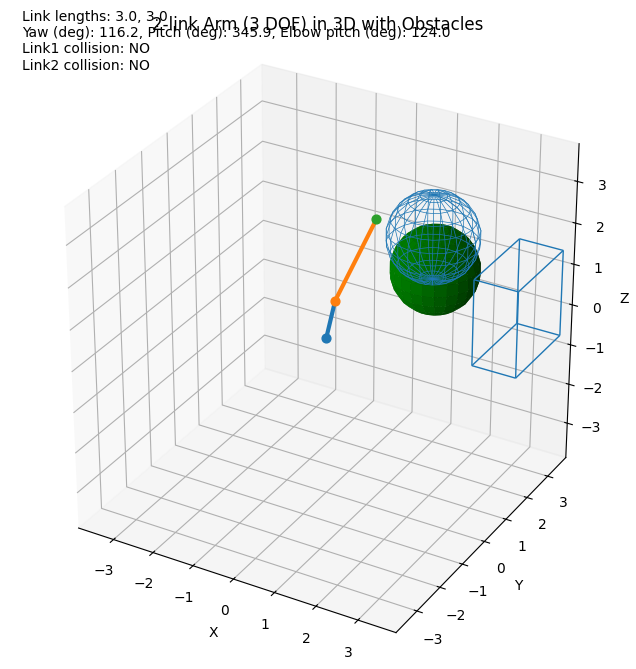

  Interpolated point 5/5: Yaw=110.5 deg, Pitch=338.1 deg, Joint Angle=115.6 deg


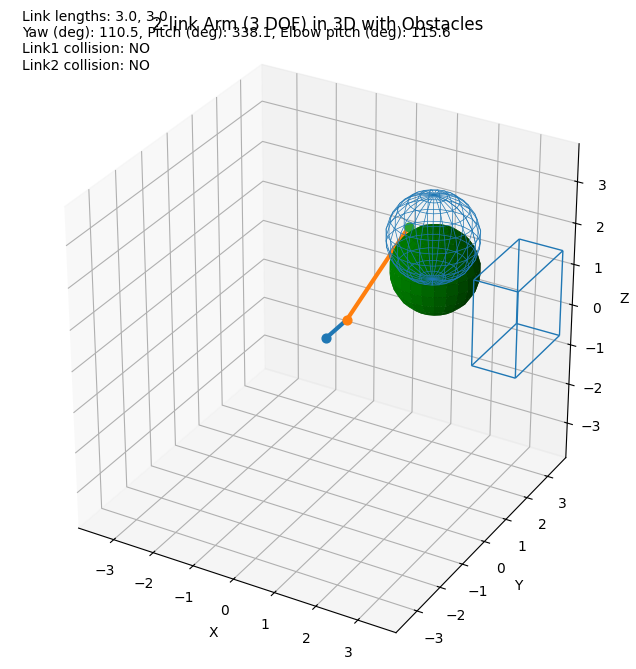


--- Checking segment from Waypoint 13 to Waypoint 14 ---
  Interpolated point 1/5: Yaw=110.5 deg, Pitch=338.1 deg, Joint Angle=115.6 deg


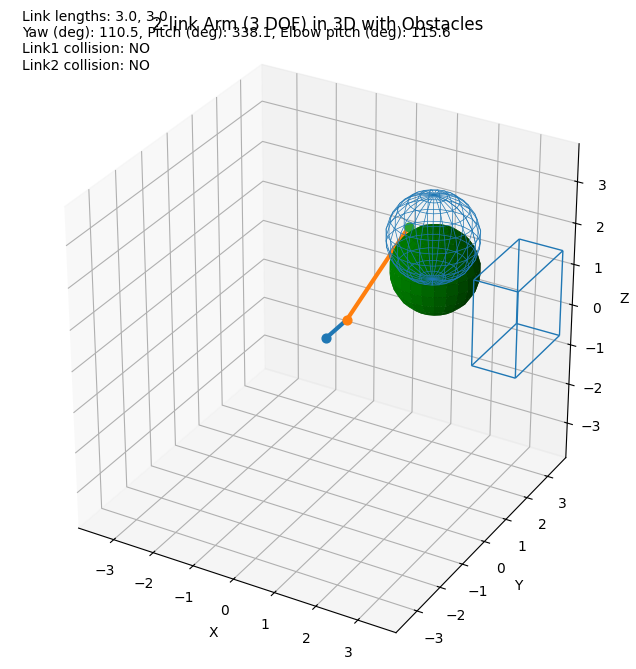

  Interpolated point 2/5: Yaw=106.1 deg, Pitch=336.8 deg, Joint Angle=113.6 deg


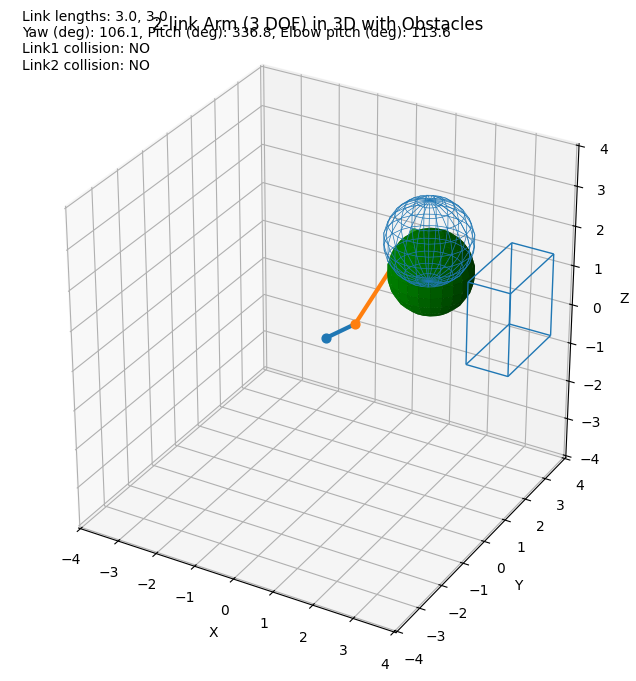

  Interpolated point 3/5: Yaw=101.7 deg, Pitch=335.5 deg, Joint Angle=111.7 deg


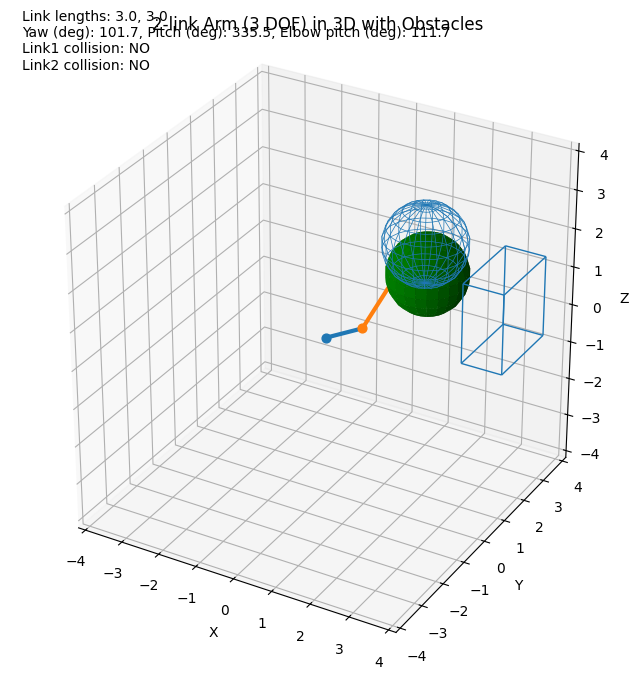

  Interpolated point 4/5: Yaw=97.3 deg, Pitch=334.2 deg, Joint Angle=109.8 deg


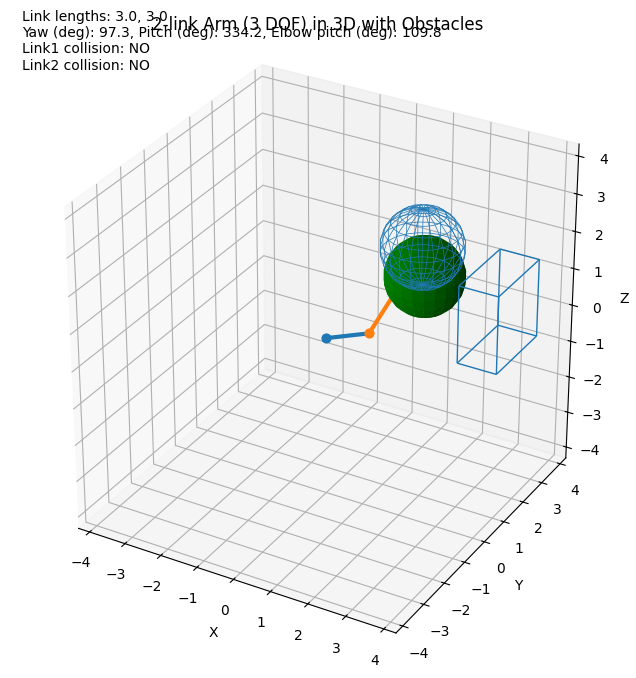

  Interpolated point 5/5: Yaw=92.9 deg, Pitch=333.0 deg, Joint Angle=107.9 deg


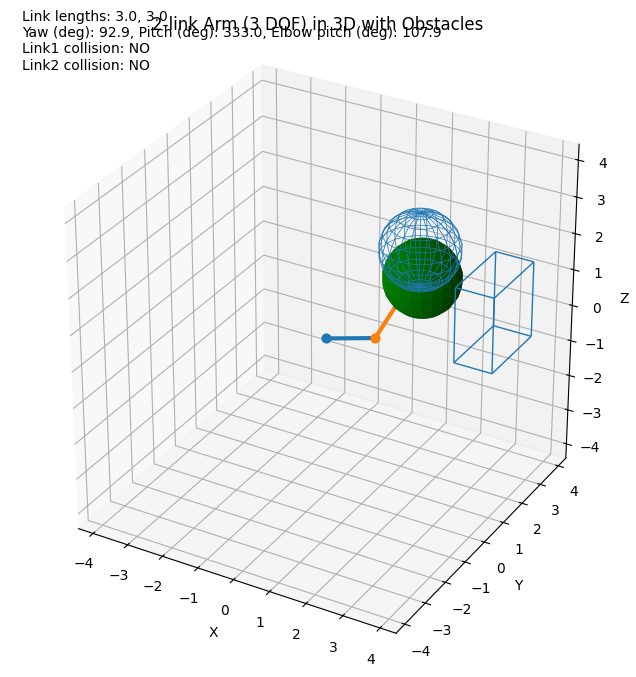


--- Checking segment from Waypoint 14 to Waypoint 15 ---
  Interpolated point 1/5: Yaw=92.9 deg, Pitch=333.0 deg, Joint Angle=107.9 deg


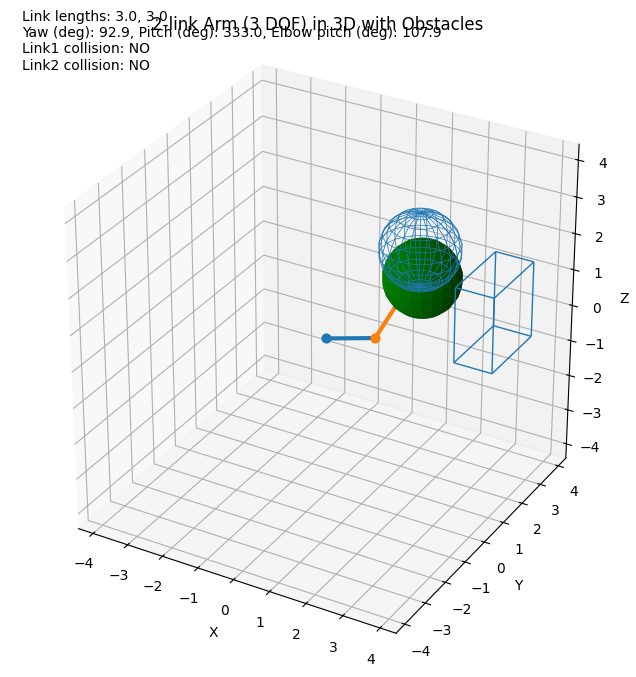

  Interpolated point 2/5: Yaw=90.2 deg, Pitch=332.0 deg, Joint Angle=106.6 deg


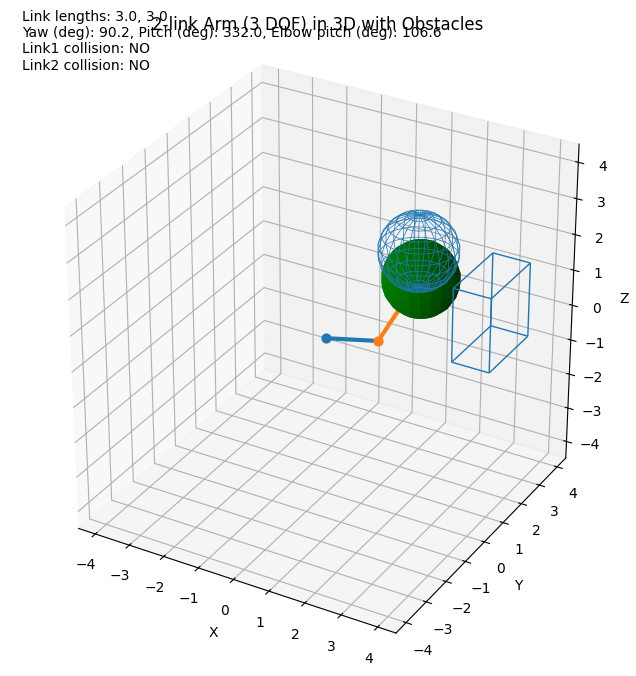

  Interpolated point 3/5: Yaw=87.6 deg, Pitch=331.1 deg, Joint Angle=105.4 deg


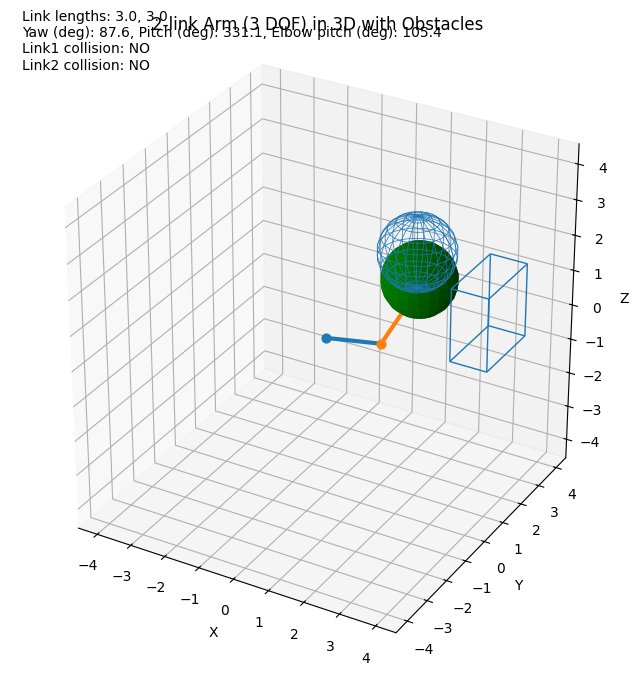

  Interpolated point 4/5: Yaw=84.9 deg, Pitch=330.1 deg, Joint Angle=104.1 deg


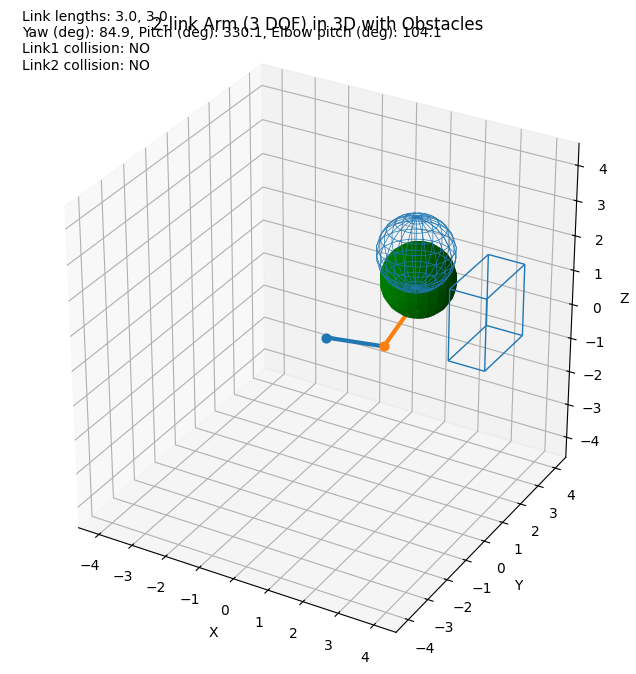

  Interpolated point 5/5: Yaw=82.3 deg, Pitch=329.1 deg, Joint Angle=102.9 deg


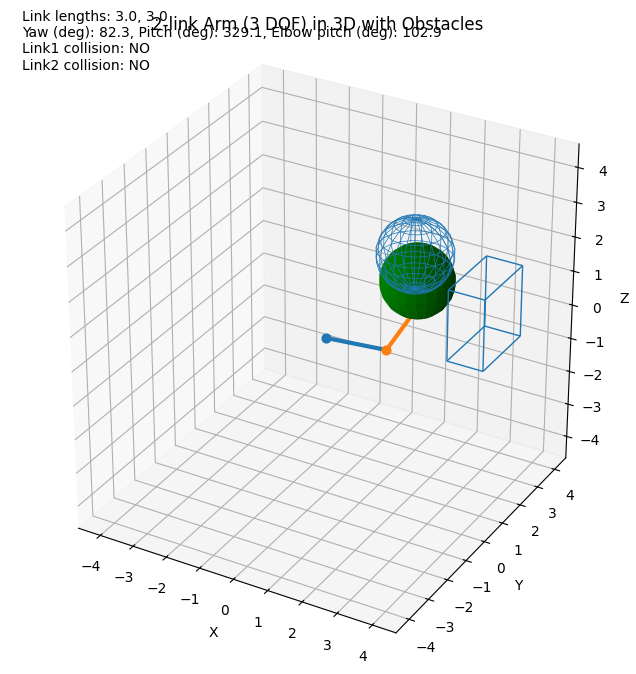

Collision check complete.


In [25]:
# @title
# import numpy as np
# import matplotlib.pyplot as plt

# # User-provided waypoints in degrees (Yaw, Pitch, Joint Angle)
# user_waypoints_deg = [
#     (360.0, 360.0, 360.0),
#     (327.61386355, 360.57254743, 338.14301177),
#     (313.8612909, 358.18043579, 324.528265),
#     (287.311412, 377.35324302, 307.28628909),
#     (274.2346814, 388.8883231, 265.48705694),
#     (252.28401297, 395.98129792, 236.42716474),
#     (225.25697886, 410.84122443, 229.99439647),
#     (189.84478588, 406.01328956, 196.44010576),
#     (175.63774734, 396.82756349, 184.632157),
#     (161.43070879, 387.64183743, 172.82420825),
#     (147.22367025, 378.45611136, 161.01625949),
#     (133.0166317, 369.2703853, 149.20831073),
#     (110.54563224, 338.10421069, 115.571214),
#     (92.88935106, 332.95715237, 107.85720457),
#     (82.28571429, 329.14285714, 102.85714286)
# ]


# # Convert waypoints to radians
# user_waypoints_rad = [tuple(np.radians(angle) for angle in wp) for wp in user_waypoints_deg]

# num_intermediate_points = 5

# print("Starting collision check for interpolated paths between waypoints...")

# for i in range(len(user_waypoints_rad) - 1):
#     start_wp = np.array(user_waypoints_rad[i])
#     end_wp = np.array(user_waypoints_rad[i+1])

#     print(f"\n--- Checking segment from Waypoint {i+1} to Waypoint {i+2} ---")

#     for j in range(num_intermediate_points):
#         # Linearly interpolate between start_wp and end_wp
#         t = j / (num_intermediate_points - 1)
#         interpolated_angles = start_wp + t * (end_wp - start_wp)

#         current_yaw = interpolated_angles[0]
#         current_pitch = interpolated_angles[1]
#         current_joint_angle = interpolated_angles[2]

#         print(f"  Interpolated point {j+1}/{num_intermediate_points}: Yaw={np.degrees(current_yaw):.1f} deg, Pitch={np.degrees(current_pitch):.1f} deg, Joint Angle={np.degrees(current_joint_angle):.1f} deg")
#         # plot_arm_and_obstacles will also print collision status
#         plot_arm_and_obstacles(link_len, current_yaw, current_pitch, current_joint_angle, obstacles)

# print("Collision check complete.")

Plotting waypoint 1/8: Yaw=360.0 deg, Pitch=360.0 deg, Joint Angle=360.0 deg


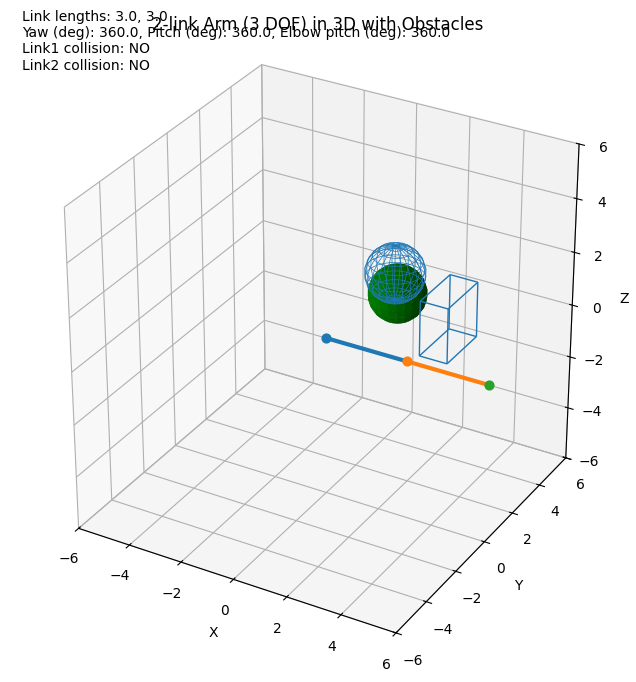

Plotting waypoint 2/8: Yaw=299.6 deg, Pitch=328.9 deg, Joint Angle=323.1 deg


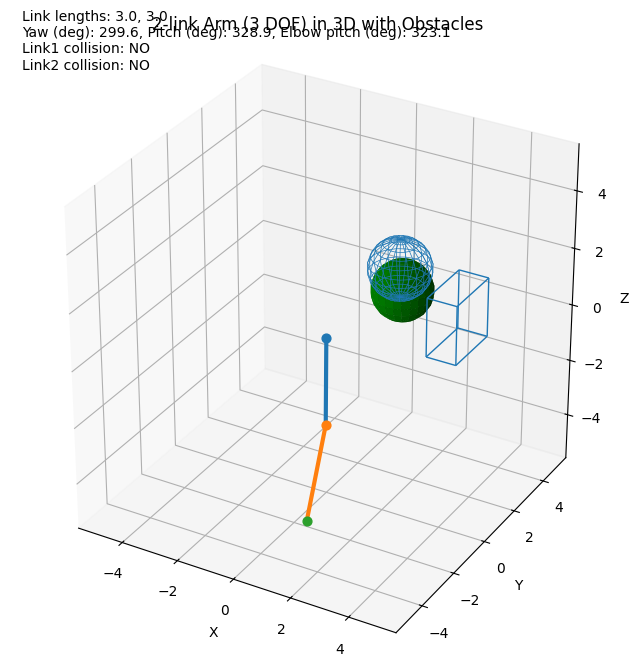

Plotting waypoint 3/8: Yaw=223.5 deg, Pitch=281.7 deg, Joint Angle=280.3 deg


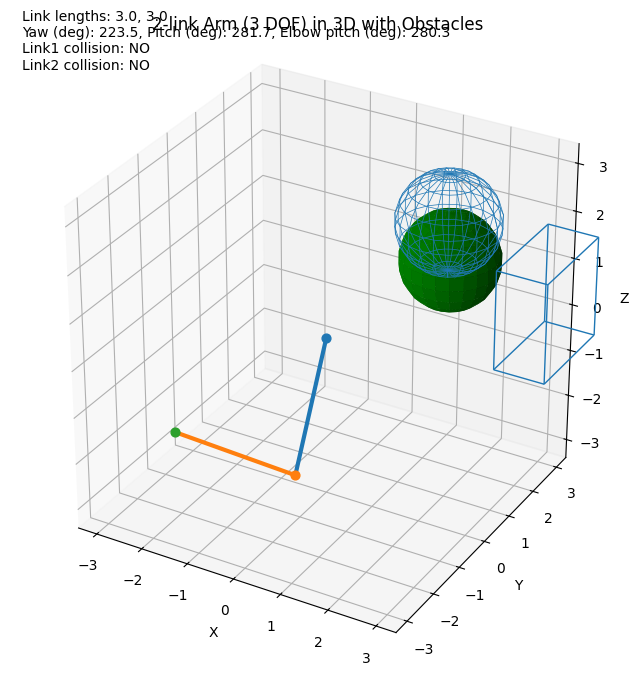

Plotting waypoint 4/8: Yaw=214.3 deg, Pitch=255.6 deg, Joint Angle=233.7 deg


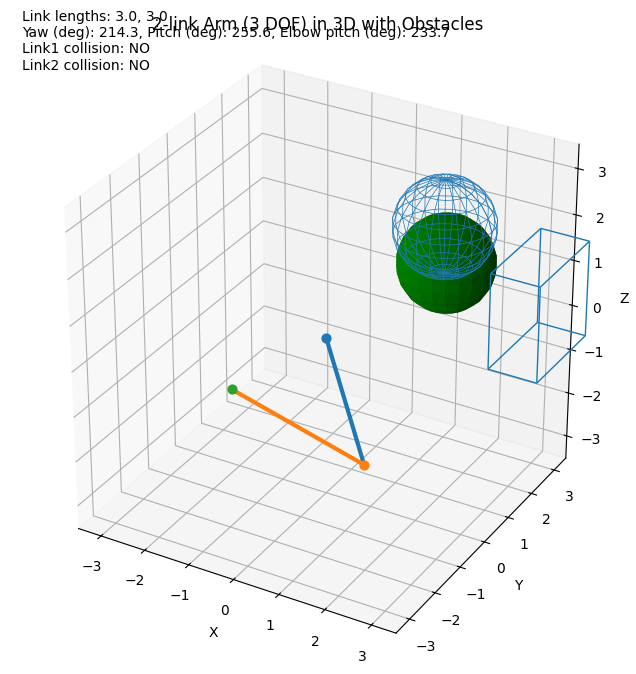

Plotting waypoint 5/8: Yaw=148.3 deg, Pitch=259.8 deg, Joint Angle=166.5 deg


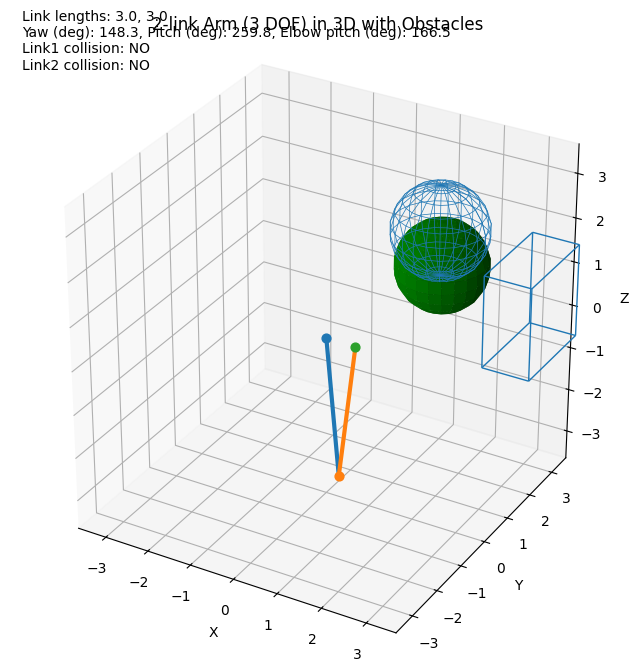

Plotting waypoint 6/8: Yaw=136.5 deg, Pitch=272.2 deg, Joint Angle=155.1 deg


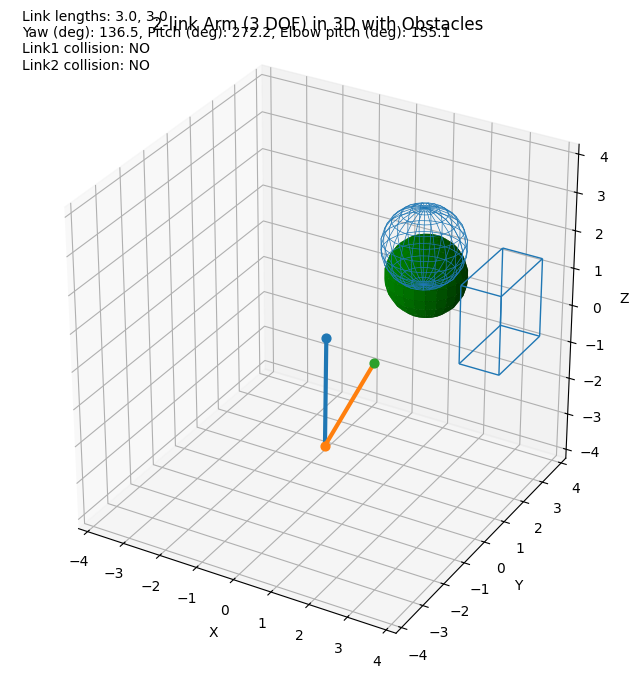

Plotting waypoint 7/8: Yaw=88.7 deg, Pitch=325.5 deg, Joint Angle=105.7 deg


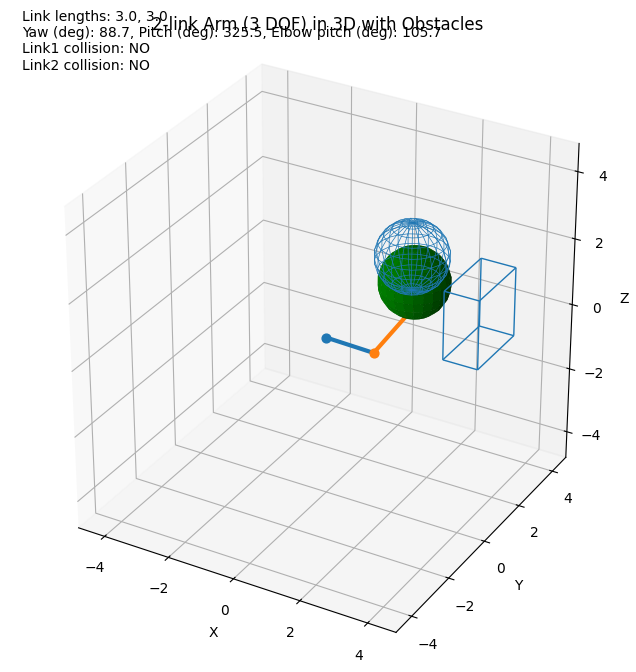

Plotting waypoint 8/8: Yaw=82.3 deg, Pitch=329.1 deg, Joint Angle=102.9 deg


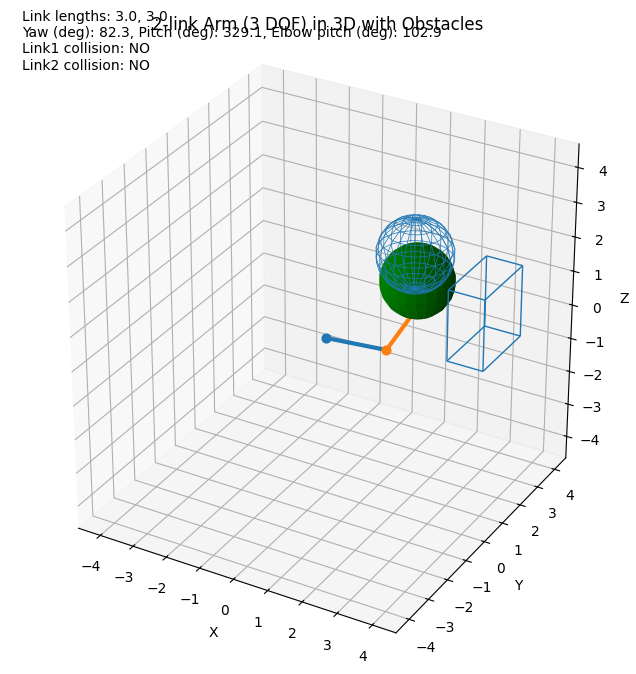

In [27]:
for i, waypoint in enumerate(path):
    # Extract the angle indices from the waypoint
    current_yaw, current_pitch, current_joint_angle = (waypoint*2*np.pi)/res_pts

    print(f"Plotting waypoint {i+1}/{len(path)}: Yaw={np.degrees(current_yaw):.1f} deg, Pitch={np.degrees(current_pitch):.1f} deg, Joint Angle={np.degrees(current_joint_angle):.1f} deg")
    # Plot the arm configuration for the current waypoint
    plot_arm_and_obstacles(link_len, current_yaw, current_pitch, current_joint_angle, obstacles)